# GAMA-09 master catalogue
## Checks and diagnostics

In [1]:
from herschelhelp_internal import git_version
print("This notebook was run with herschelhelp_internal version: \n{}".format(git_version()))

This notebook was run with herschelhelp_internal version: 
44f1ae0 (Thu Nov 30 18:27:54 2017 +0000)


In [2]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import locale
locale.setlocale(locale.LC_ALL, 'en_GB')

import os
import time
import itertools

from astropy.coordinates import SkyCoord
from astropy.table import Table
from astropy import units as u
from astropy import visualization as vis
import numpy as np
from matplotlib_venn import venn3, venn2

from herschelhelp_internal.masterlist import nb_compare_mags, nb_ccplots, nb_histograms

In [3]:
OUT_DIR = os.environ.get('OUT_DIR', "./data")
SUFFIX = os.environ.get('SUFFIX', time.strftime("_%Y%m%d"))
SUFFIX = "_20171024"

master_catalogue = Table.read("{}/master_catalogue_gama-09{}.fits".format(OUT_DIR, SUFFIX))

## I - Summary of wavelength domains

In [4]:
flag_obs = master_catalogue['flag_optnir_obs']
flag_det = master_catalogue['flag_optnir_det']

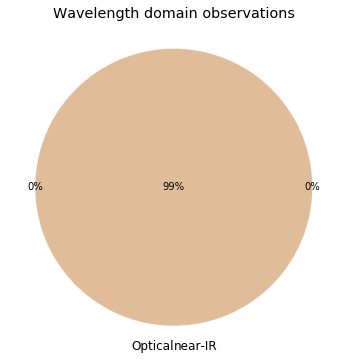

In [5]:
venn2(
    [
        np.sum(flag_obs == 1),
        np.sum(flag_obs == 2),
        np.sum(flag_obs == 3)
    ],
    set_labels=('Optical', 'near-IR'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/len(flag_obs)))
)
plt.title("Wavelength domain observations");

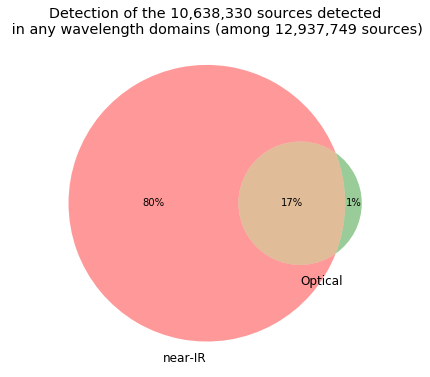

In [6]:
venn2(
    [
        np.sum(flag_det[flag_obs == 3] == 1),
        np.sum(flag_det[flag_obs == 3] == 2),
        np.sum(flag_det[flag_obs == 3] == 3)
    ],
    set_labels=('near-IR', 'Optical'),
    subset_label_formatter=lambda x: "{}%".format(int(100*x/np.sum(flag_det != 0)))
)
plt.title("Detection of the {} sources detected\n in any wavelength domains "
          "(among {} sources)".format(
              locale.format('%d', np.sum(flag_det != 0), grouping=True),
              locale.format('%d', len(flag_det), grouping=True)));

## II - Comparing magnitudes in similar filters

The master list if composed of several catalogues containing magnitudes in similar filters on different instruments. We are comparing the magnitudes in these corresponding filters.

In [7]:
u_bands = ["Megacam u",            "OmegaCAM u"]
g_bands = ["Megacam g", "DECam g", "OmegaCAM g", "SUPRIME g", "GPC1 g"]
r_bands = ["Megacam r", "DECam r", "OmegaCAM r", "SUPRIME r", "GPC1 r"]
i_bands = ["Megacam i", "DECam i", "OmegaCAM i", "SUPRIME i", "GPC1 i"]
z_bands = ["Megacam z", "DECam z",           "SUPRIME z", "GPC1 z"]
y_bands = [ "DECam y",  "SUPRIME y", "GPC1 y", "VISTA y"]

In [8]:
for band in g_bands:
    print(band, 'max:', np.nanmax(master_catalogue["m_{}".format(band.replace(" ", "_").lower())]))

Megacam g max: 29.9969997406
DECam g max: nan
OmegaCAM g max: 42.6942


/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:355: RuntimeWarning: All-NaN axis encountered
  warnings.warn("All-NaN axis encountered", RuntimeWarning)


SUPRIME g max: inf
GPC1 g max: 31.5160999298


### II.a - Comparing depths

We compare the histograms of the total aperture magnitudes of similar bands.

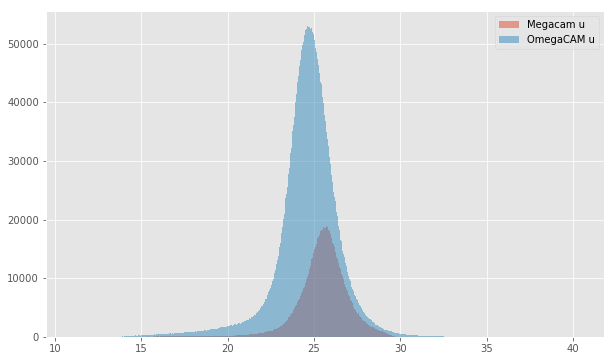

HELP warning: the column m_decam_g (DECam g) is empty.


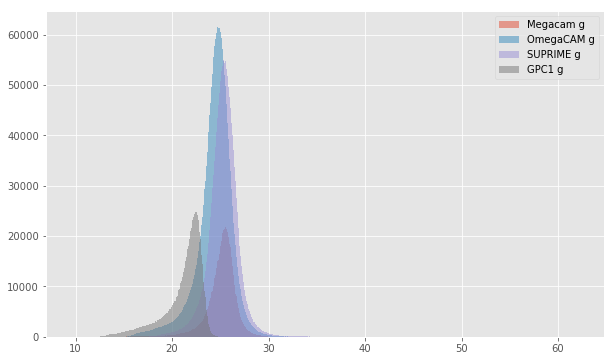

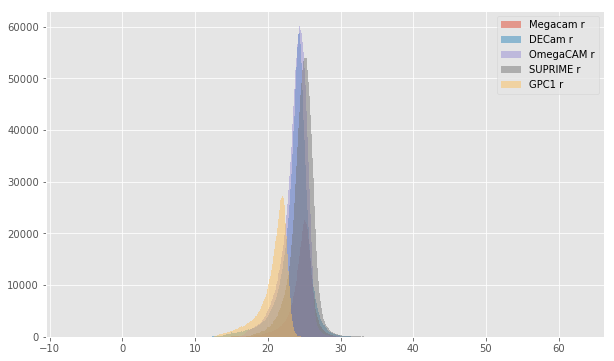

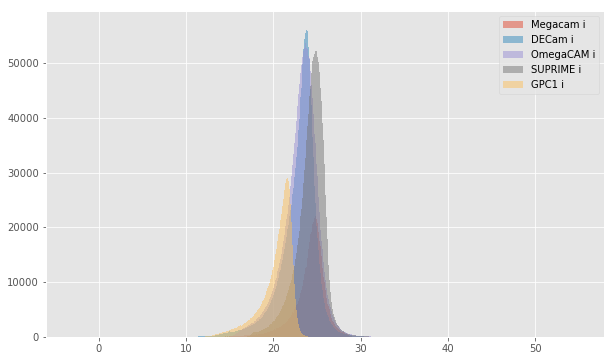

HELP warning: the column m_decam_z (DECam z) is empty.


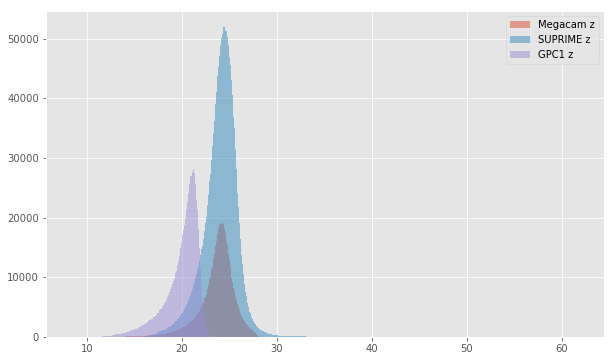

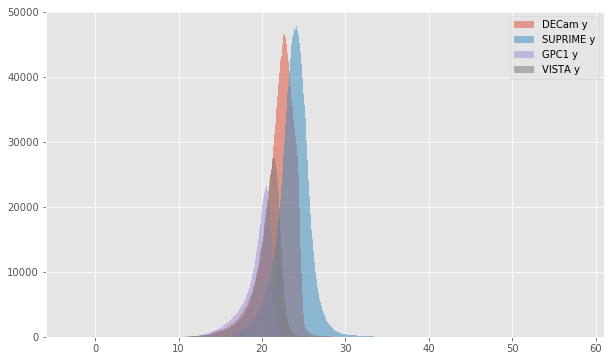

In [9]:
for bands in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    colnames = ["m_{}".format(band.replace(" ", "_").lower()) for band in bands]
    nb_histograms(master_catalogue, colnames, bands)

### II.b - Comparing magnitudes

We compare one to one each magnitude in similar bands.

OmegaCAM u (aperture) - Megacam u (aperture):
- Median: 0.16
- Median Absolute Deviation: 0.38
- 1% percentile: -2.3490675354003905
- 99% percentile: 2.532443161010736


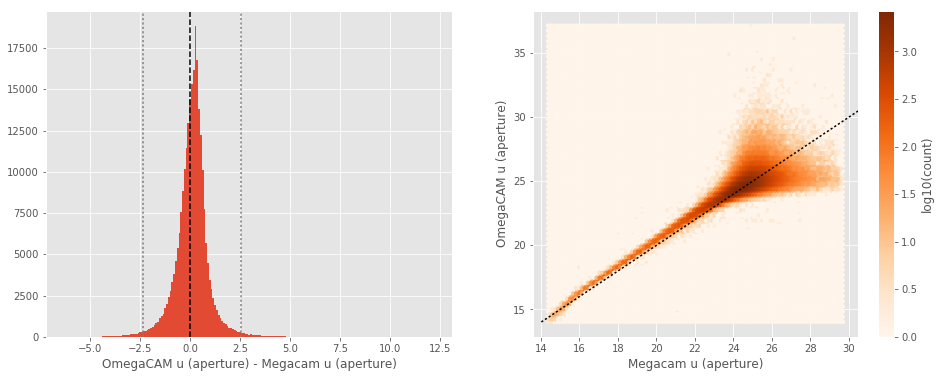

OmegaCAM u (total) - Megacam u (total):
- Median: 0.26
- Median Absolute Deviation: 0.43
- 1% percentile: -2.302859649658203
- 99% percentile: 3.4061350631713845


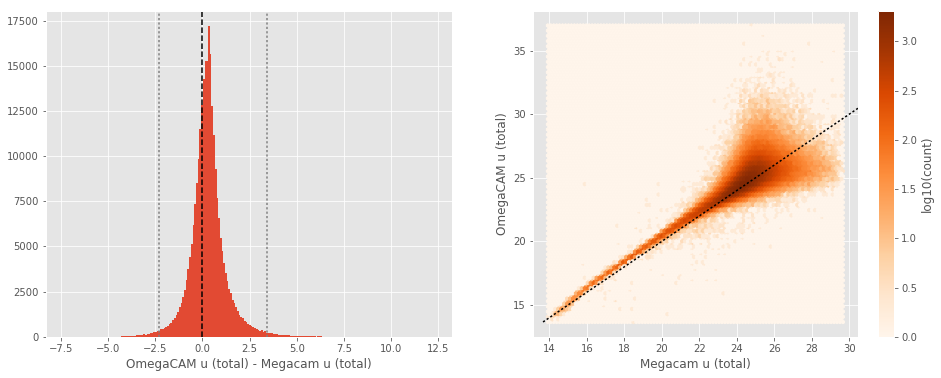

No sources have both Megacam g (aperture) and DECam g (aperture) values.
No sources have both Megacam g (total) and DECam g (total) values.
OmegaCAM g (aperture) - Megacam g (aperture):
- Median: 0.17
- Median Absolute Deviation: 0.18
- 1% percentile: -0.8424013137817382
- 99% percentile: 1.606662597656257


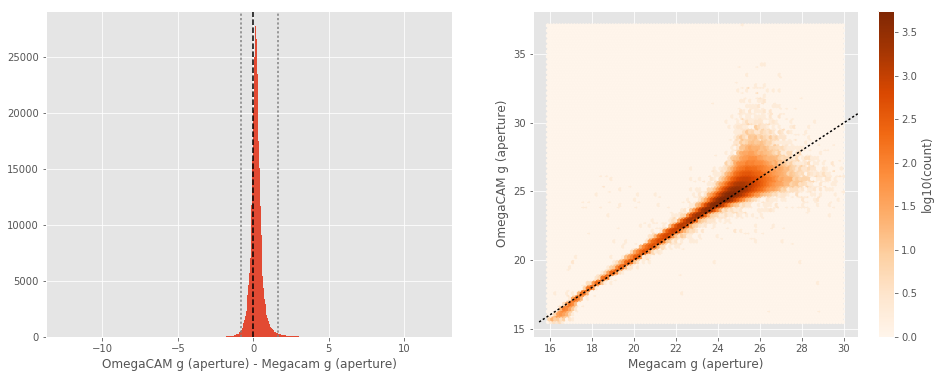

OmegaCAM g (total) - Megacam g (total):
- Median: 0.29
- Median Absolute Deviation: 0.23
- 1% percentile: -0.8038003158569336
- 99% percentile: 2.5004053497314445


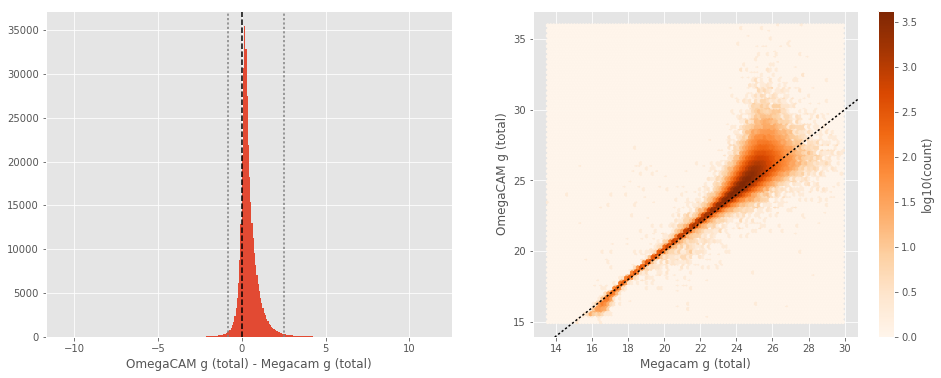

No sources have both Megacam g (aperture) and SUPRIME g (aperture) values.
No sources have both Megacam g (total) and SUPRIME g (total) values.
GPC1 g (aperture) - Megacam g (aperture):
- Median: -0.12
- Median Absolute Deviation: 0.25
- 1% percentile: -2.0083609104156492
- 99% percentile: 2.483756618499758


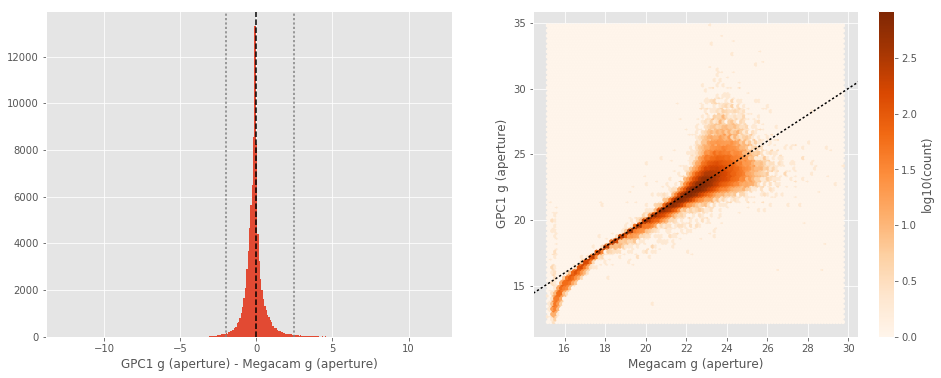

GPC1 g (total) - Megacam g (total):
- Median: 0.04
- Median Absolute Deviation: 0.14
- 1% percentile: -1.225975799560547
- 99% percentile: 0.8711746215820322


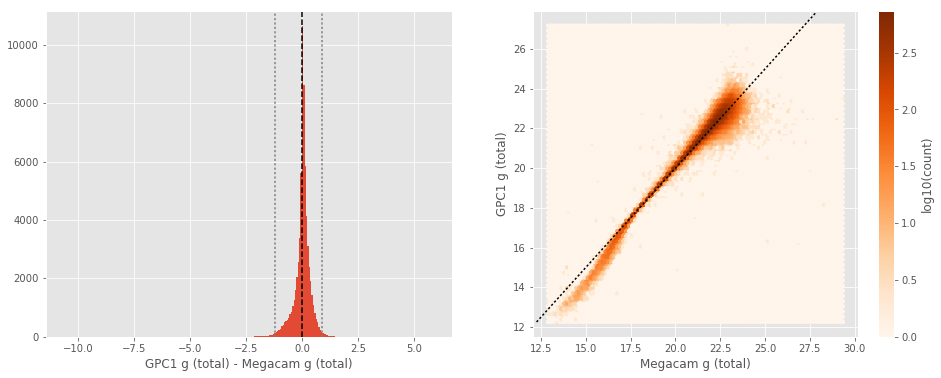

No sources have both DECam g (aperture) and OmegaCAM g (aperture) values.
No sources have both DECam g (total) and OmegaCAM g (total) values.
No sources have both DECam g (aperture) and SUPRIME g (aperture) values.
No sources have both DECam g (total) and SUPRIME g (total) values.
No sources have both DECam g (aperture) and GPC1 g (aperture) values.
No sources have both DECam g (total) and GPC1 g (total) values.
SUPRIME g (aperture) - OmegaCAM g (aperture):
- Median: -0.12
- Median Absolute Deviation: 0.15
- 1% percentile: -1.6483201026916503
- 99% percentile: 0.9457317352294936


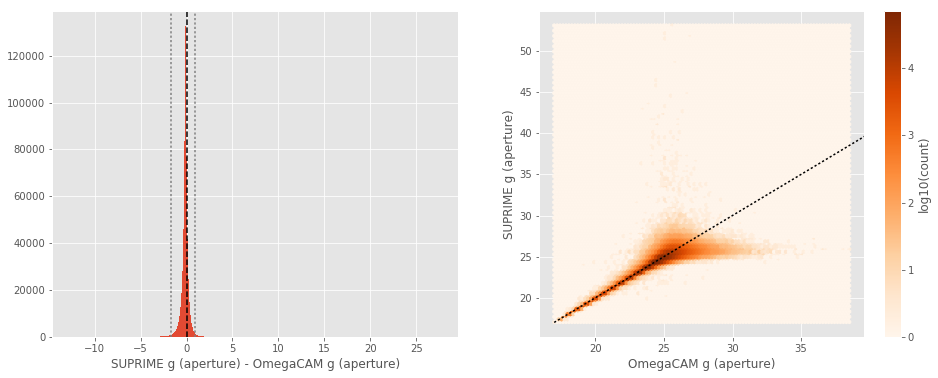

SUPRIME g (total) - OmegaCAM g (total):
- Median: -0.30
- Median Absolute Deviation: 0.26
- 1% percentile: -2.7267112350463867
- 99% percentile: 1.2997833633422795


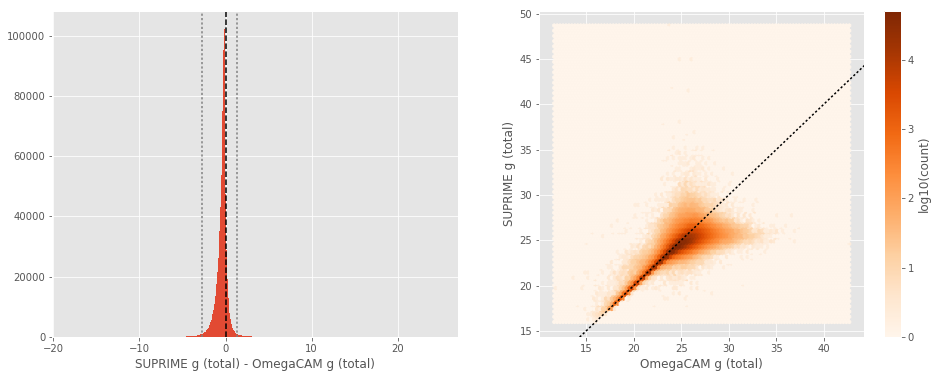

GPC1 g (aperture) - OmegaCAM g (aperture):
- Median: -0.24
- Median Absolute Deviation: 0.29
- 1% percentile: -2.0095847320556643
- 99% percentile: 2.26985788345337


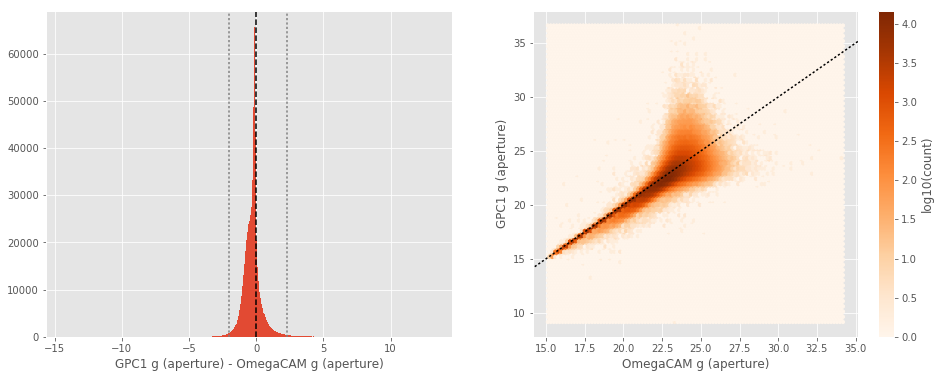

GPC1 g (total) - OmegaCAM g (total):
- Median: -0.07
- Median Absolute Deviation: 0.14
- 1% percentile: -1.422968978881836
- 99% percentile: 0.8120863342285154


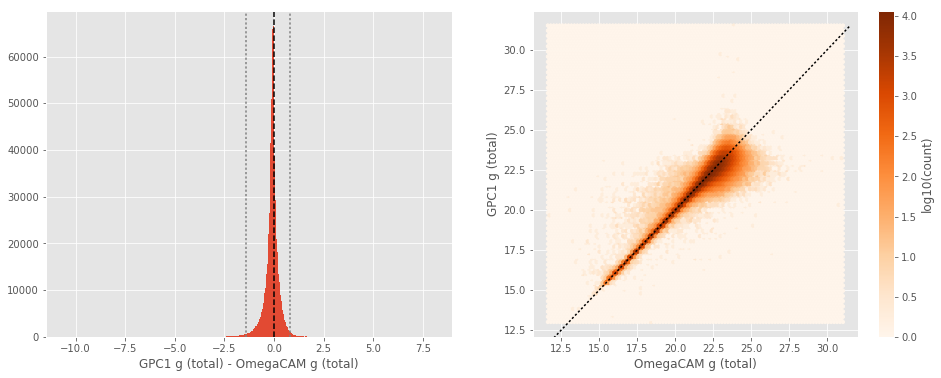

GPC1 g (aperture) - SUPRIME g (aperture):
- Median: -0.15
- Median Absolute Deviation: 0.32
- 1% percentile: -2.1191638946533202
- 99% percentile: 2.4618473052978525


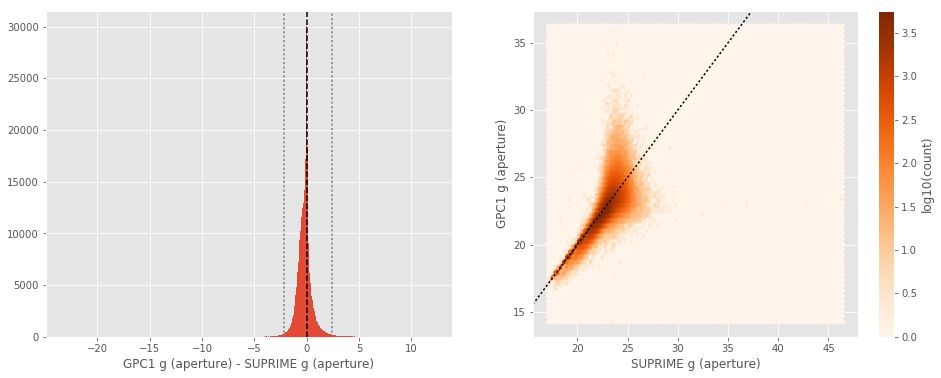

GPC1 g (total) - SUPRIME g (total):
- Median: 0.04
- Median Absolute Deviation: 0.15
- 1% percentile: -1.3399610900878907
- 99% percentile: 0.8890690612792971


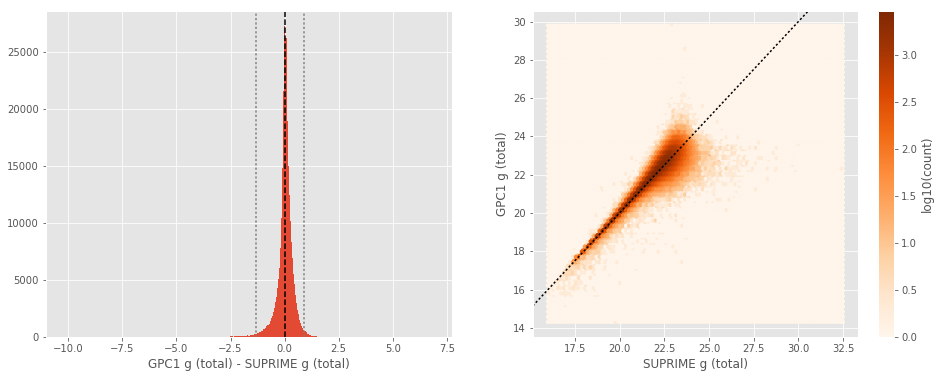

DECam r (aperture) - Megacam r (aperture):
- Median: 0.76
- Median Absolute Deviation: 0.45
- 1% percentile: -0.7991800308227539
- 99% percentile: 3.72212049484251


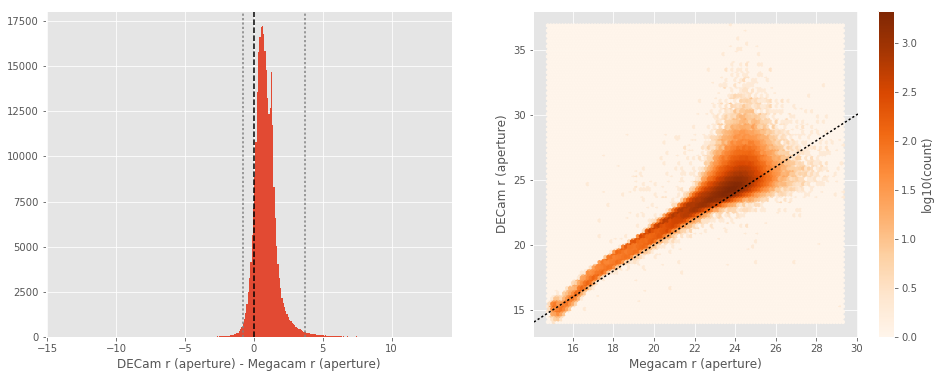

DECam r (total) - Megacam r (total):
- Median: 0.88
- Median Absolute Deviation: 0.42
- 1% percentile: -0.7036796569824219
- 99% percentile: 3.7943765258789055


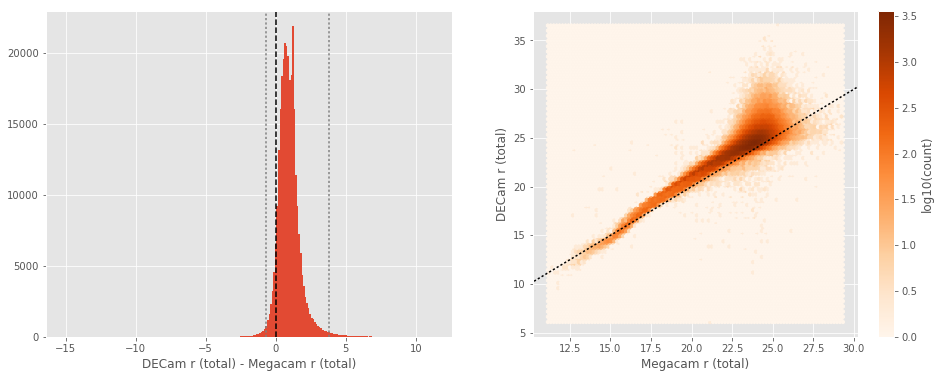

OmegaCAM r (aperture) - Megacam r (aperture):
- Median: 0.04
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9313429069519044
- 99% percentile: 0.7994451522827124


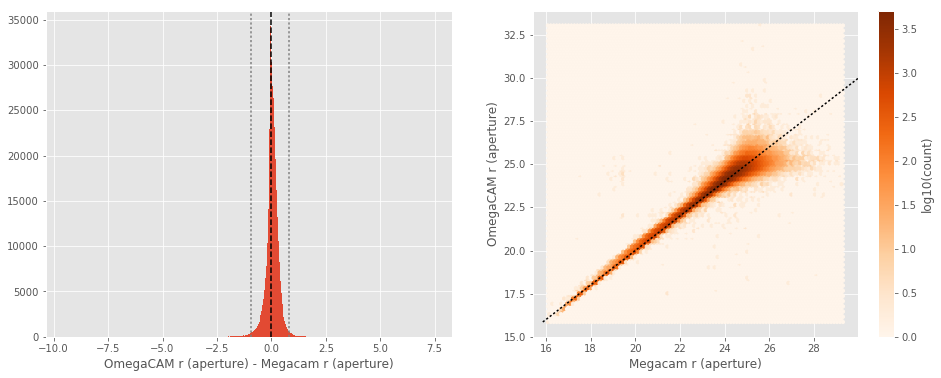

OmegaCAM r (total) - Megacam r (total):
- Median: 0.11
- Median Absolute Deviation: 0.16
- 1% percentile: -0.9327923774719238
- 99% percentile: 1.341959476470949


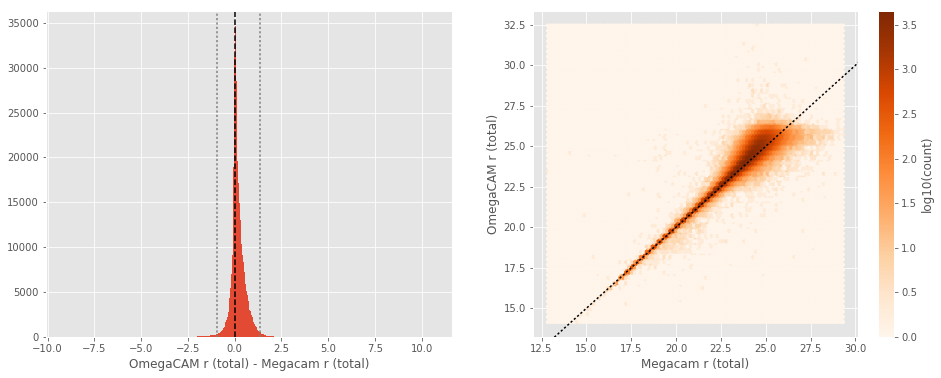

No sources have both Megacam r (aperture) and SUPRIME r (aperture) values.
No sources have both Megacam r (total) and SUPRIME r (total) values.
GPC1 r (aperture) - Megacam r (aperture):
- Median: -0.10
- Median Absolute Deviation: 0.17
- 1% percentile: -1.4761760711669922
- 99% percentile: 1.7432920837402366


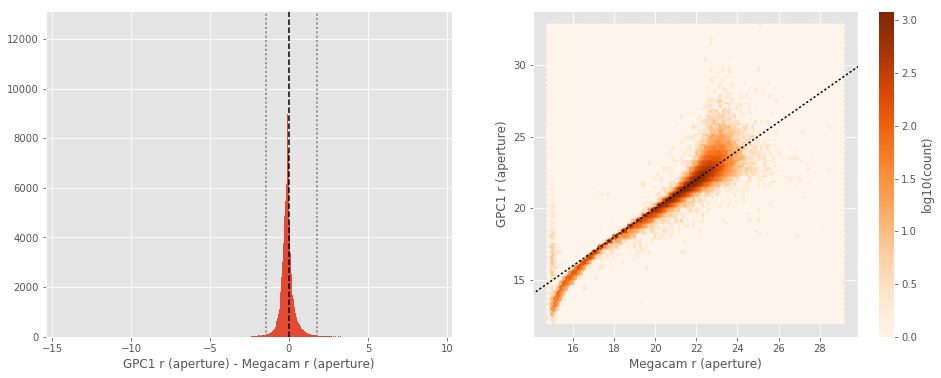

GPC1 r (total) - Megacam r (total):
- Median: 0.07
- Median Absolute Deviation: 0.11
- 1% percentile: -0.9554996490478516
- 99% percentile: 0.8046718597412081


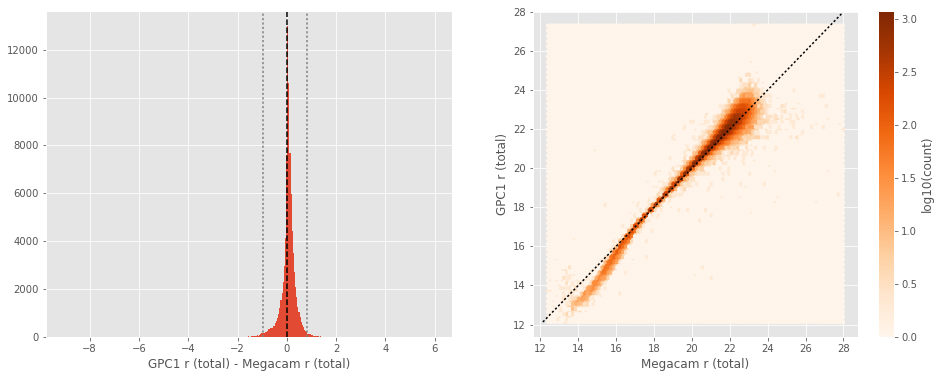

OmegaCAM r (aperture) - DECam r (aperture):
- Median: -0.68
- Median Absolute Deviation: 0.46
- 1% percentile: -3.600275726318359
- 99% percentile: 0.6733466339111338


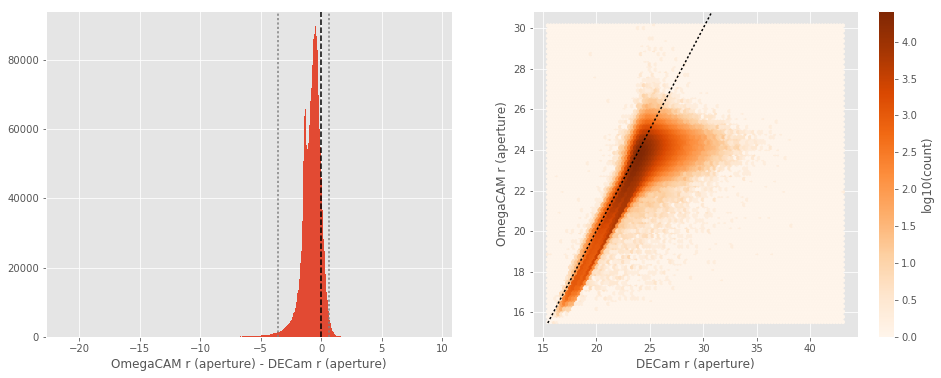

OmegaCAM r (total) - DECam r (total):
- Median: -0.79
- Median Absolute Deviation: 0.44
- 1% percentile: -3.278699016571045
- 99% percentile: 0.9290608215332021


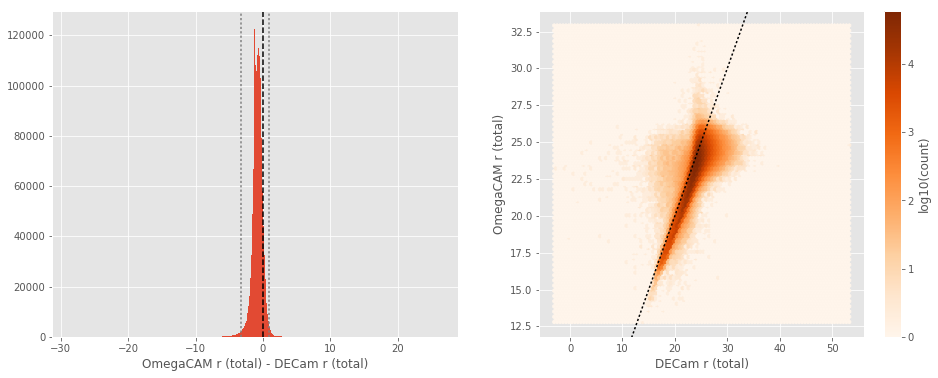

SUPRIME r (aperture) - DECam r (aperture):
- Median: -0.70
- Median Absolute Deviation: 0.48
- 1% percentile: -3.858505229949951
- 99% percentile: 1.1288696098327633


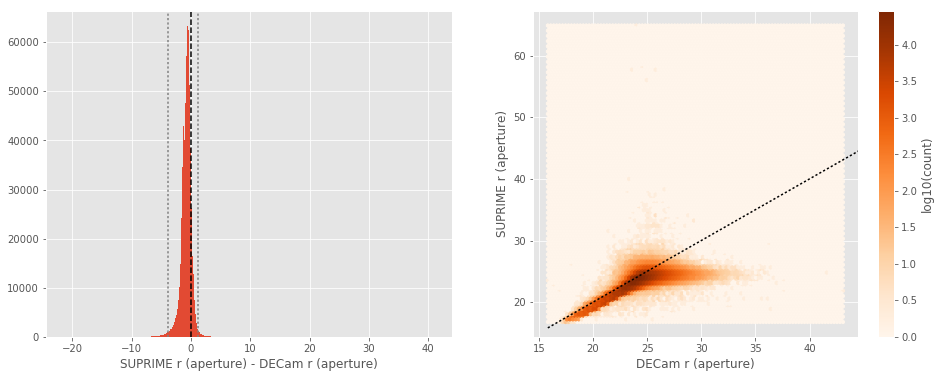

SUPRIME r (total) - DECam r (total):
- Median: -0.94
- Median Absolute Deviation: 0.41
- 1% percentile: -3.8704082489013674
- 99% percentile: 1.2903237152099436


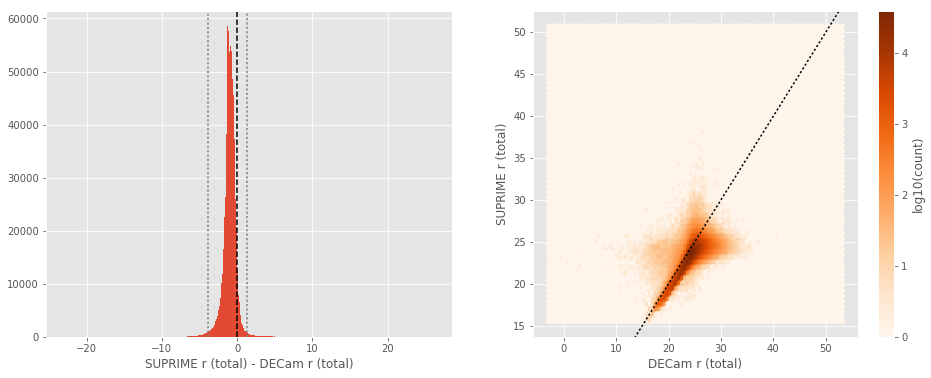

GPC1 r (aperture) - DECam r (aperture):
- Median: -1.10
- Median Absolute Deviation: 0.36
- 1% percentile: -3.287621021270752
- 99% percentile: 0.7571353912353516


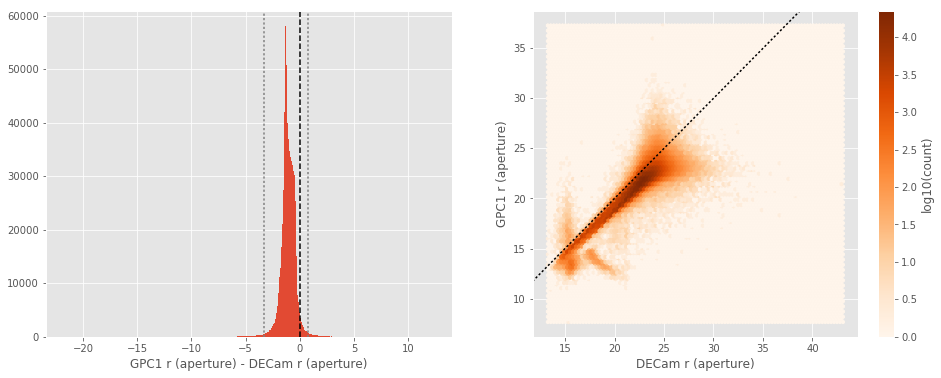

GPC1 r (total) - DECam r (total):
- Median: -0.95
- Median Absolute Deviation: 0.33
- 1% percentile: -2.4433358001708987
- 99% percentile: 0.2867892646789567


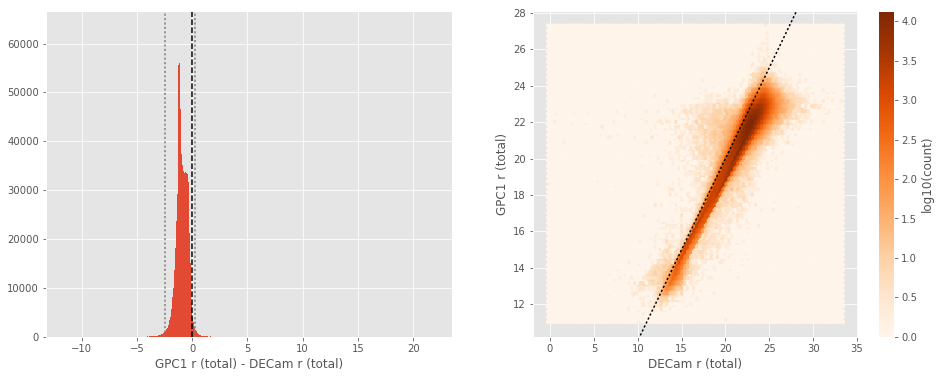

SUPRIME r (aperture) - OmegaCAM r (aperture):
- Median: -0.03
- Median Absolute Deviation: 0.11
- 1% percentile: -0.7935680770874024
- 99% percentile: 0.921067752838133


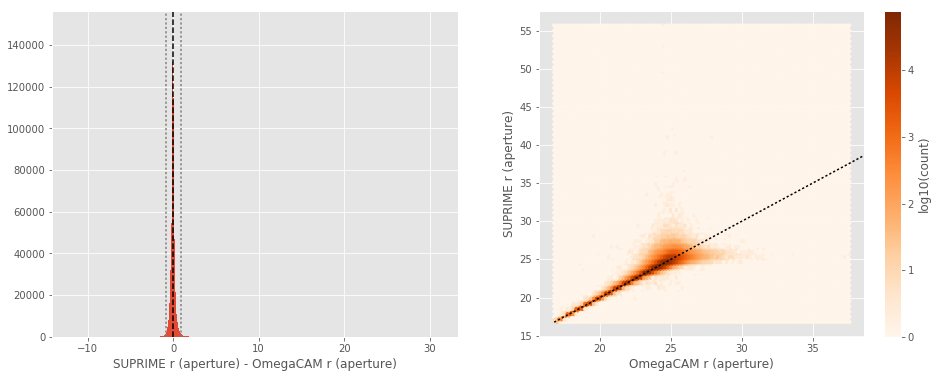

SUPRIME r (total) - OmegaCAM r (total):
- Median: -0.15
- Median Absolute Deviation: 0.20
- 1% percentile: -1.6458333587646483
- 99% percentile: 1.3592094230651939


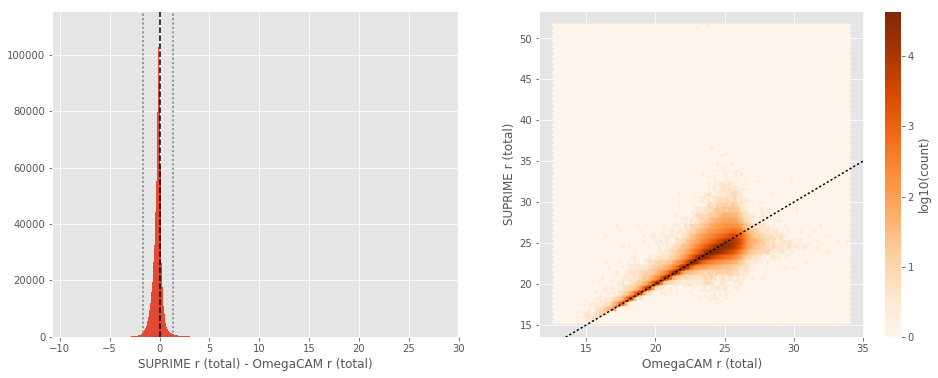

GPC1 r (aperture) - OmegaCAM r (aperture):
- Median: -0.08
- Median Absolute Deviation: 0.22
- 1% percentile: -1.2040434074401856
- 99% percentile: 1.765226192474362


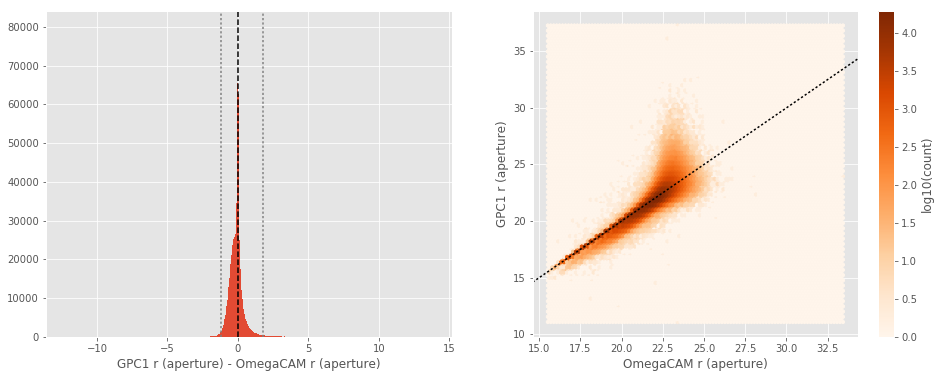

GPC1 r (total) - OmegaCAM r (total):
- Median: 0.06
- Median Absolute Deviation: 0.10
- 1% percentile: -0.821661376953125
- 99% percentile: 0.8214283752441407


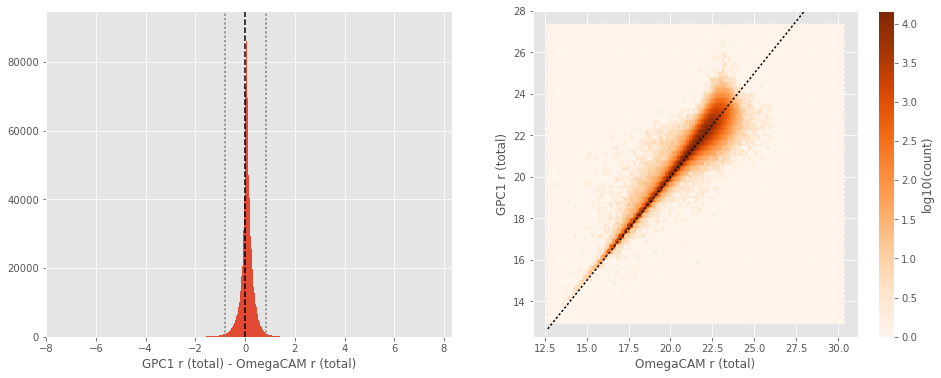

GPC1 r (aperture) - SUPRIME r (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.23
- 1% percentile: -1.407801628112793
- 99% percentile: 1.833282470703125


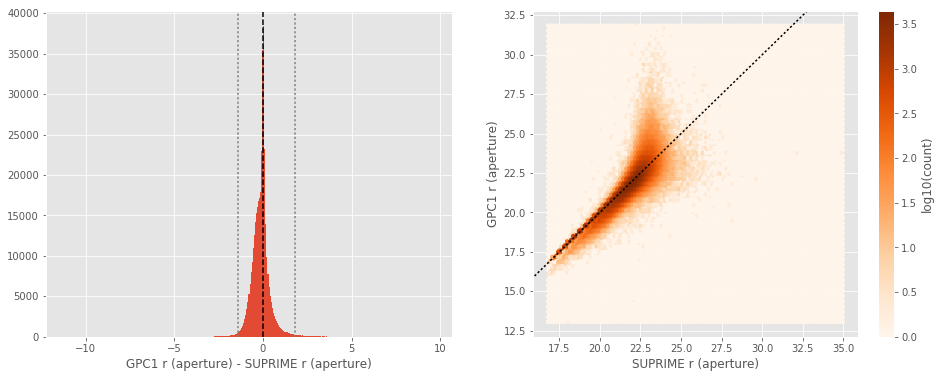

GPC1 r (total) - SUPRIME r (total):
- Median: 0.09
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8761194610595703
- 99% percentile: 0.8236692237854001


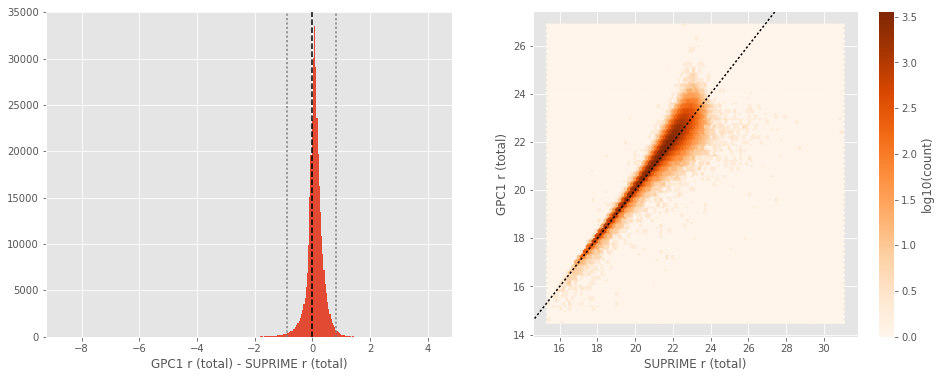

DECam i (aperture) - Megacam i (aperture):
- Median: 0.46
- Median Absolute Deviation: 0.35
- 1% percentile: -0.865513916015625
- 99% percentile: 3.3499763107299882


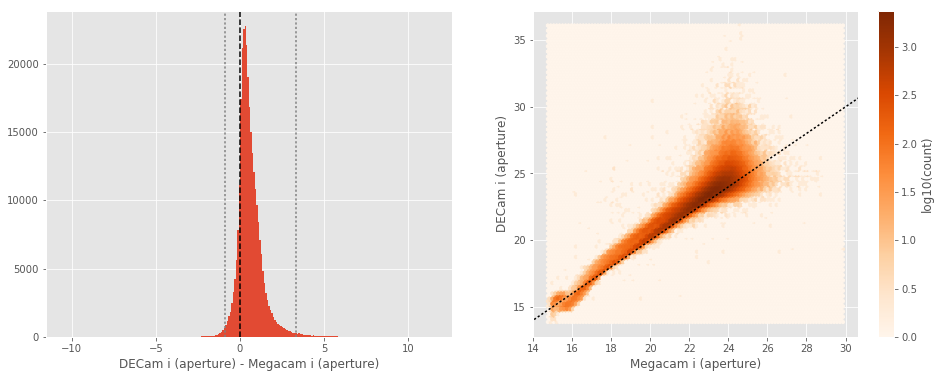

DECam i (total) - Megacam i (total):
- Median: 0.51
- Median Absolute Deviation: 0.33
- 1% percentile: -0.9825173187255859
- 99% percentile: 2.9249610137939377


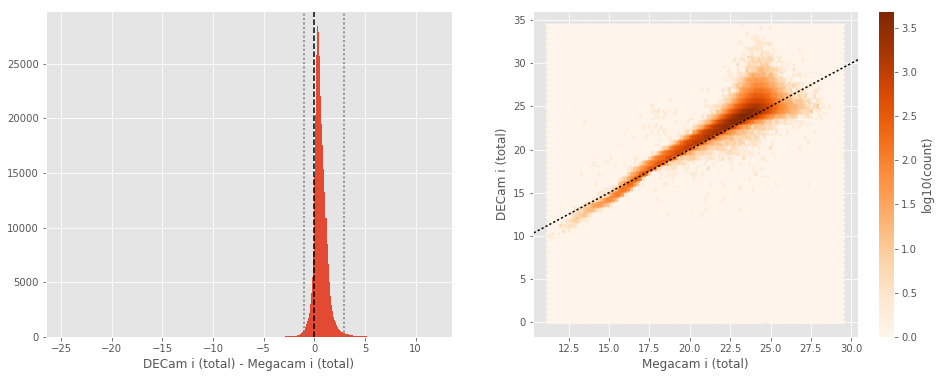

OmegaCAM i (aperture) - Megacam i (aperture):
- Median: 0.08
- Median Absolute Deviation: 0.19
- 1% percentile: -1.3832026290893555
- 99% percentile: 1.9946659278869625


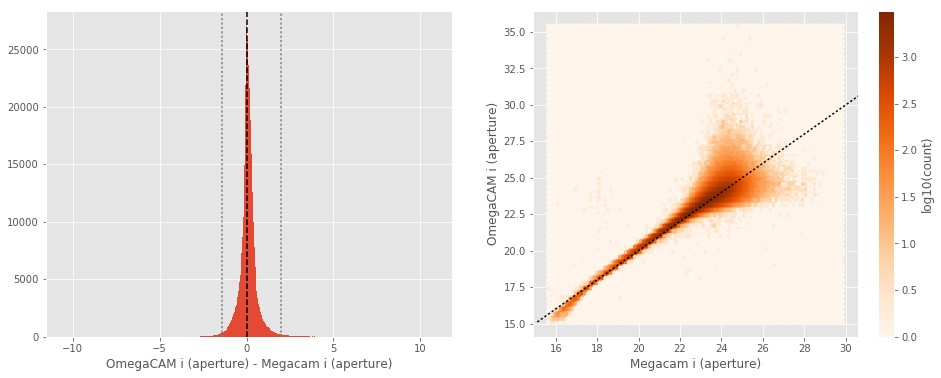

OmegaCAM i (total) - Megacam i (total):
- Median: 0.18
- Median Absolute Deviation: 0.25
- 1% percentile: -1.241908721923828
- 99% percentile: 2.9465506744384746


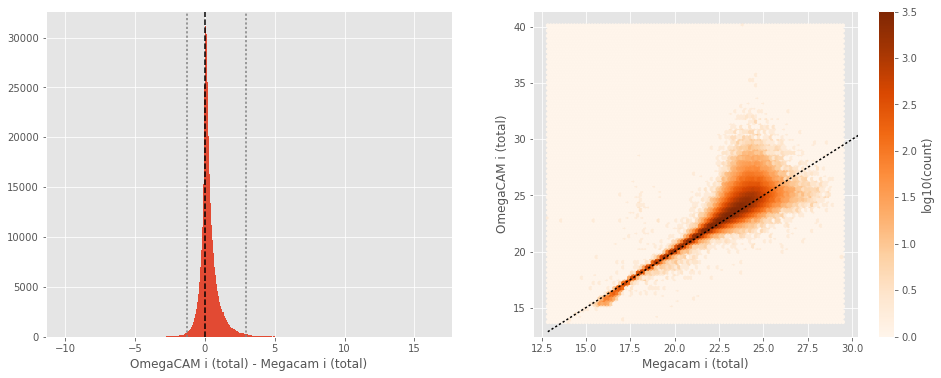

No sources have both Megacam i (aperture) and SUPRIME i (aperture) values.
No sources have both Megacam i (total) and SUPRIME i (total) values.
GPC1 i (aperture) - Megacam i (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.14
- 1% percentile: -1.4700759220123292
- 99% percentile: 1.0049385833740292


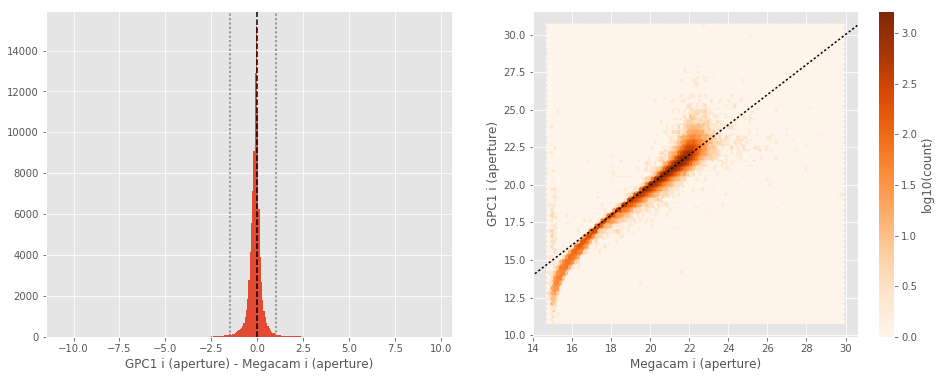

GPC1 i (total) - Megacam i (total):
- Median: 0.11
- Median Absolute Deviation: 0.09
- 1% percentile: -0.995428466796875
- 99% percentile: 0.6898637390136718


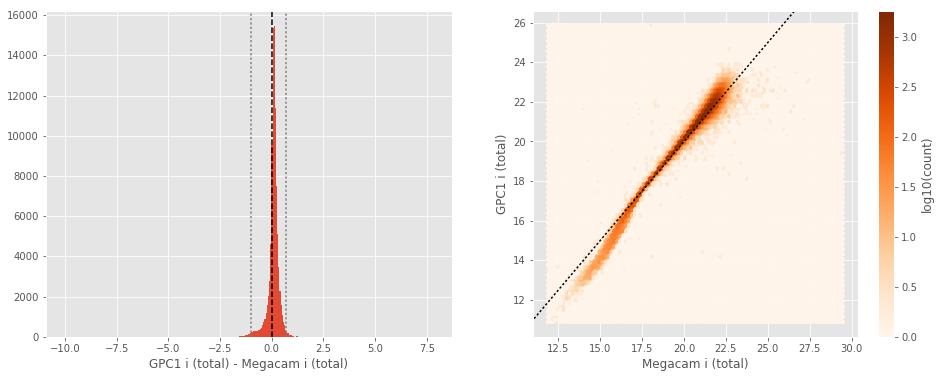

OmegaCAM i (aperture) - DECam i (aperture):
- Median: -0.33
- Median Absolute Deviation: 0.36
- 1% percentile: -2.8974876403808594
- 99% percentile: 1.2281379699707031


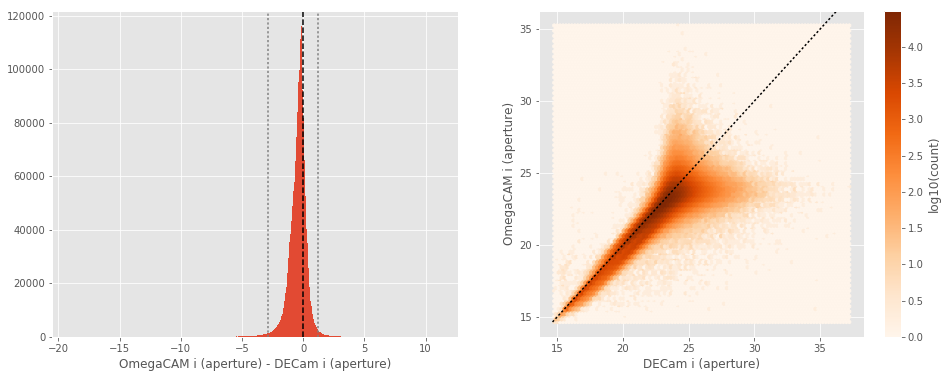

OmegaCAM i (total) - DECam i (total):
- Median: -0.34
- Median Absolute Deviation: 0.33
- 1% percentile: -1.8832291793823244
- 99% percentile: 2.0605910491943344


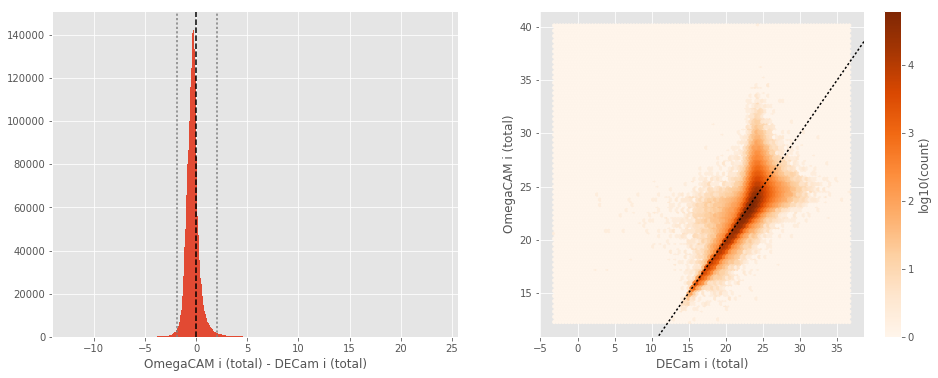

SUPRIME i (aperture) - DECam i (aperture):
- Median: -0.45
- Median Absolute Deviation: 0.38
- 1% percentile: -3.4602115058898923
- 99% percentile: 0.9395537567138703


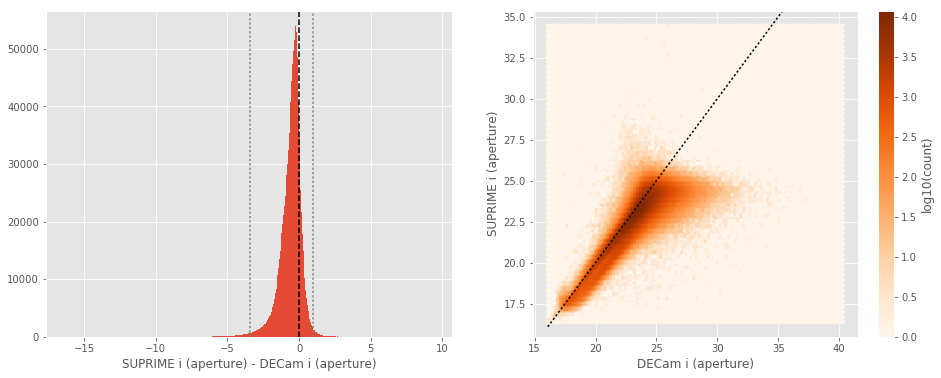

SUPRIME i (total) - DECam i (total):
- Median: -0.61
- Median Absolute Deviation: 0.33
- 1% percentile: -2.9741110610961914
- 99% percentile: 1.3414017868042012


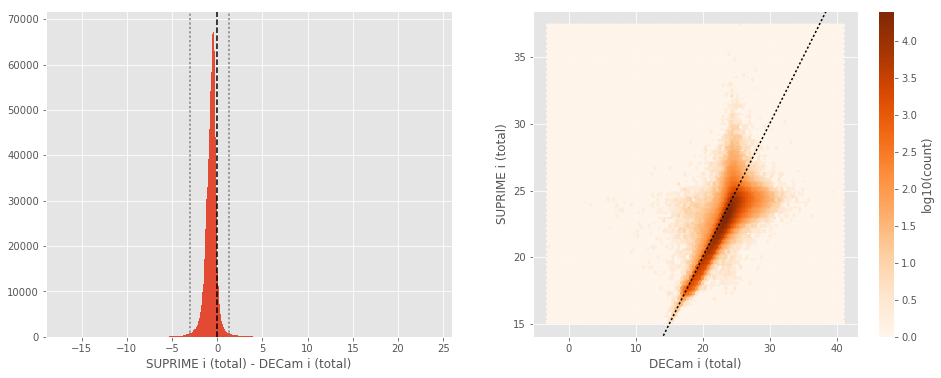

GPC1 i (aperture) - DECam i (aperture):
- Median: -0.53
- Median Absolute Deviation: 0.30
- 1% percentile: -2.468780975341797
- 99% percentile: 0.6279870605468756


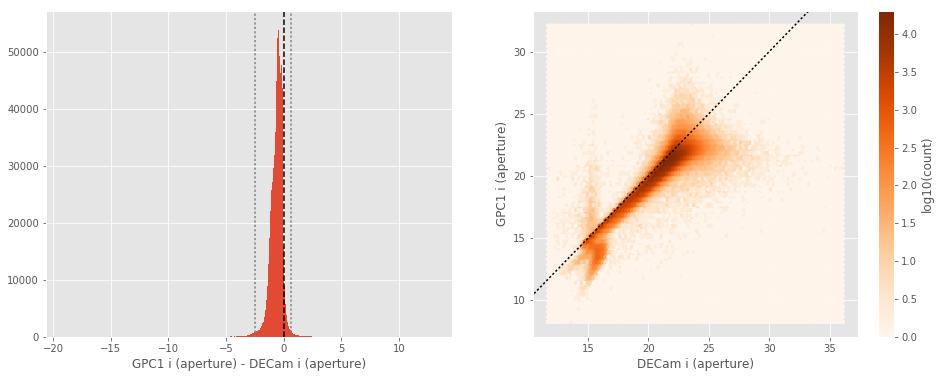

GPC1 i (total) - DECam i (total):
- Median: -0.33
- Median Absolute Deviation: 0.29
- 1% percentile: -1.6684288024902343
- 99% percentile: 0.5558063507080089


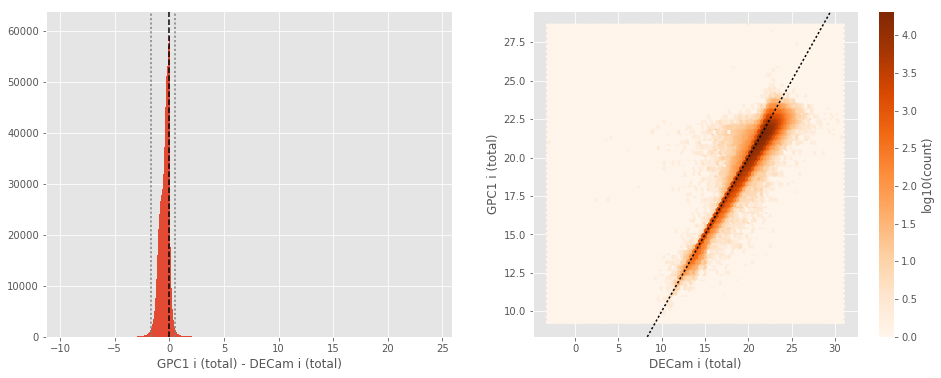

SUPRIME i (aperture) - OmegaCAM i (aperture):
- Median: -0.08
- Median Absolute Deviation: 0.16
- 1% percentile: -1.892069320678711
- 99% percentile: 1.1368710327148435


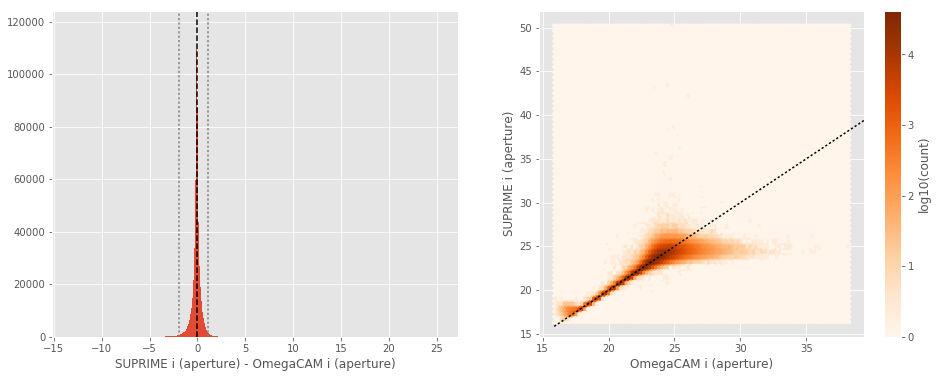

SUPRIME i (total) - OmegaCAM i (total):
- Median: -0.26
- Median Absolute Deviation: 0.26
- 1% percentile: -2.98850830078125
- 99% percentile: 1.467466888427733


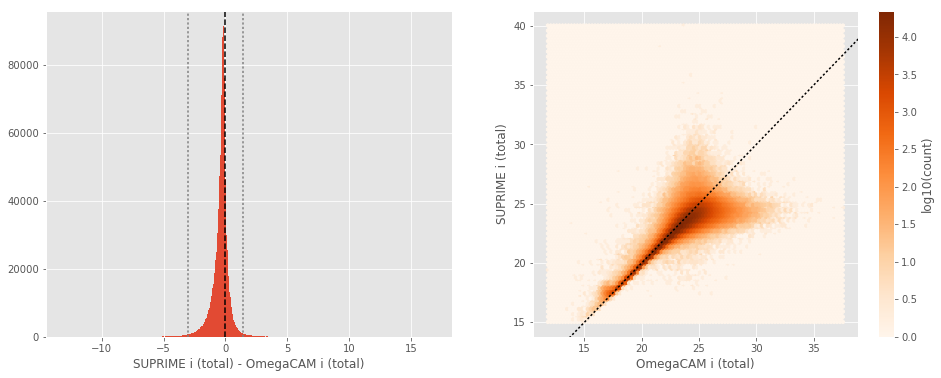

GPC1 i (aperture) - OmegaCAM i (aperture):
- Median: -0.08
- Median Absolute Deviation: 0.17
- 1% percentile: -1.0490192413330077
- 99% percentile: 0.9511314392089947


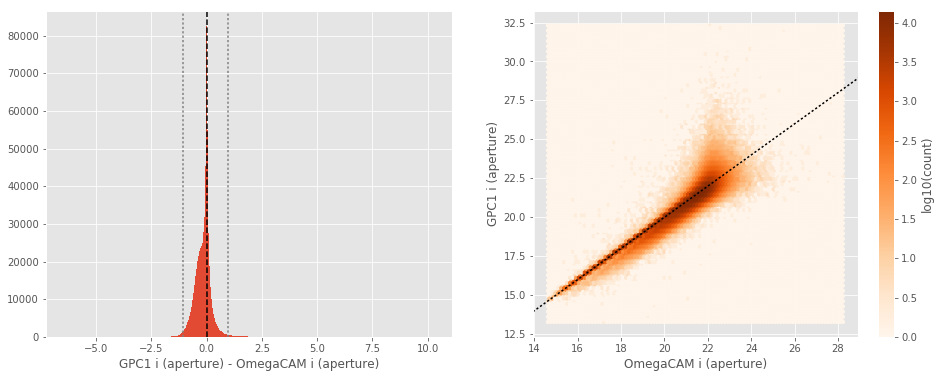

GPC1 i (total) - OmegaCAM i (total):
- Median: 0.05
- Median Absolute Deviation: 0.10
- 1% percentile: -0.7674687004089356
- 99% percentile: 0.7097541618347214


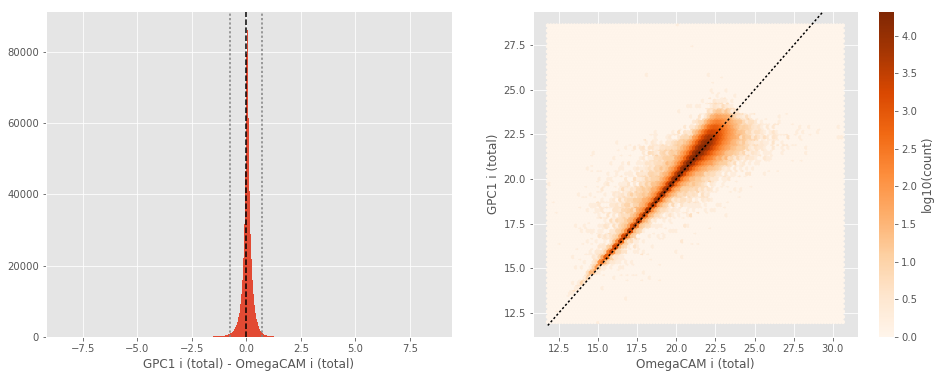

GPC1 i (aperture) - SUPRIME i (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.19
- 1% percentile: -1.1339794158935548
- 99% percentile: 1.0847755432128883


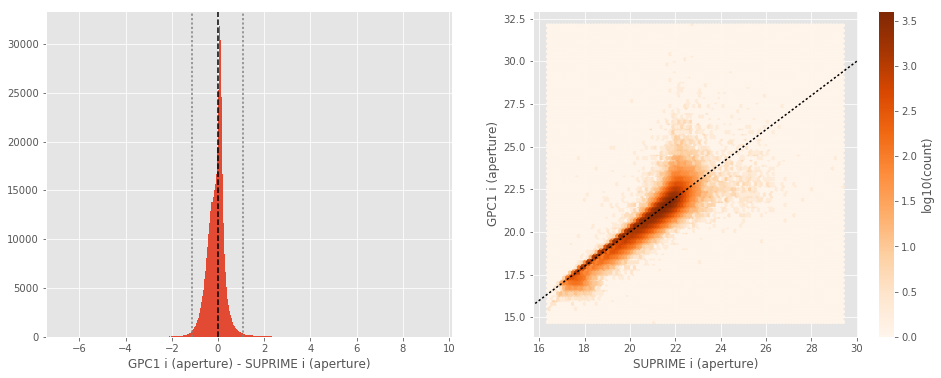

GPC1 i (total) - SUPRIME i (total):
- Median: 0.20
- Median Absolute Deviation: 0.10
- 1% percentile: -0.6746941757202148
- 99% percentile: 0.7867731475830082


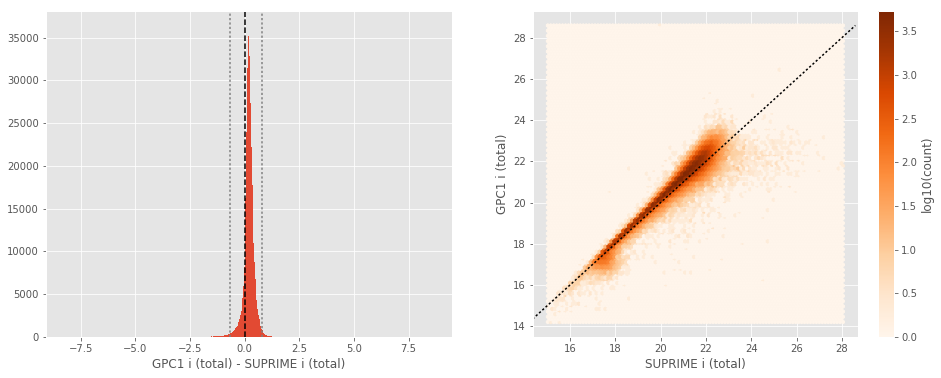

No sources have both Megacam z (aperture) and DECam z (aperture) values.
No sources have both Megacam z (total) and DECam z (total) values.
No sources have both Megacam z (aperture) and SUPRIME z (aperture) values.
No sources have both Megacam z (total) and SUPRIME z (total) values.
GPC1 z (aperture) - Megacam z (aperture):
- Median: -0.13
- Median Absolute Deviation: 0.12
- 1% percentile: -1.0555000305175781
- 99% percentile: 1.2839590072631815


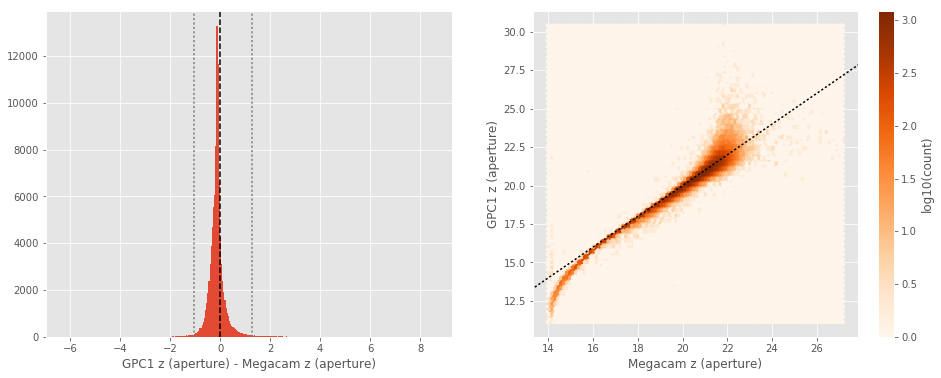

GPC1 z (total) - Megacam z (total):
- Median: 0.05
- Median Absolute Deviation: 0.10
- 1% percentile: -0.7186002731323242
- 99% percentile: 0.7616004943847656


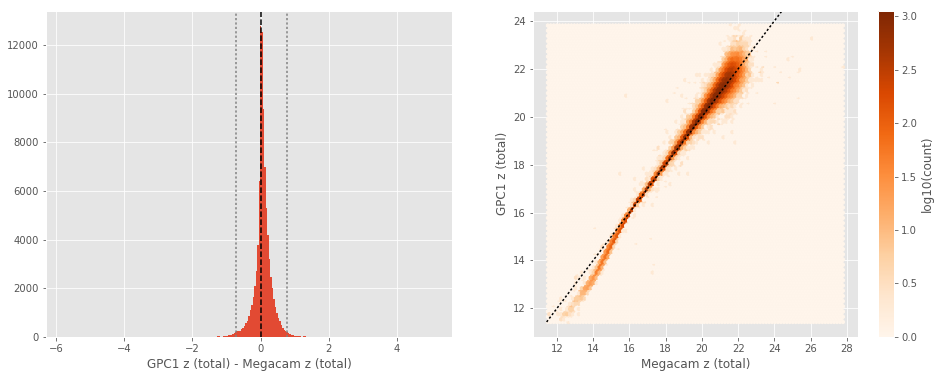

No sources have both DECam z (aperture) and SUPRIME z (aperture) values.
No sources have both DECam z (total) and SUPRIME z (total) values.
No sources have both DECam z (aperture) and GPC1 z (aperture) values.
No sources have both DECam z (total) and GPC1 z (total) values.
GPC1 z (aperture) - SUPRIME z (aperture):
- Median: -0.00
- Median Absolute Deviation: 0.18
- 1% percentile: -0.963115119934082
- 99% percentile: 1.2577524185180697


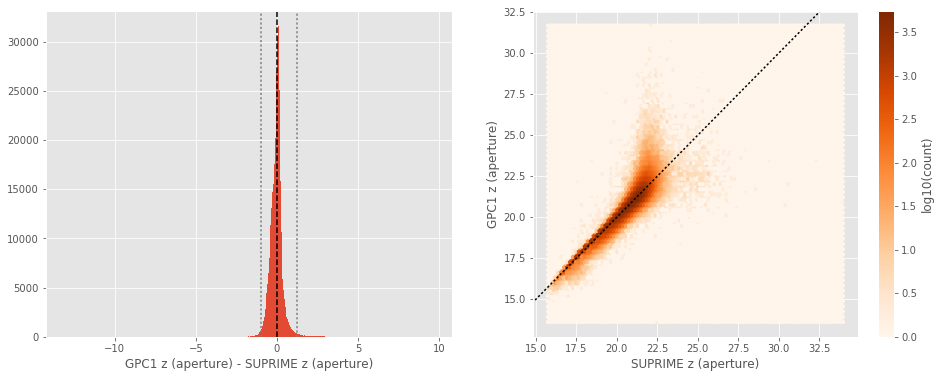

GPC1 z (total) - SUPRIME z (total):
- Median: 0.21
- Median Absolute Deviation: 0.12
- 1% percentile: -0.5583659553527832
- 99% percentile: 0.911898288726806


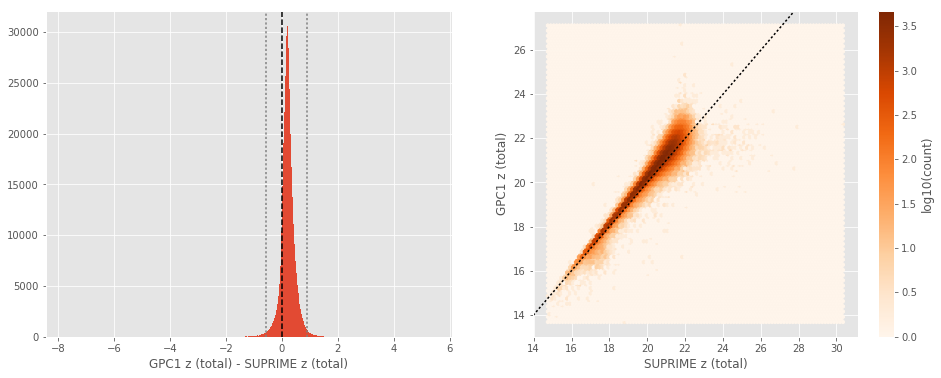

SUPRIME y (aperture) - DECam y (aperture):
- Median: -0.09
- Median Absolute Deviation: 0.23
- 1% percentile: -2.69098237991333
- 99% percentile: 1.273048076629637


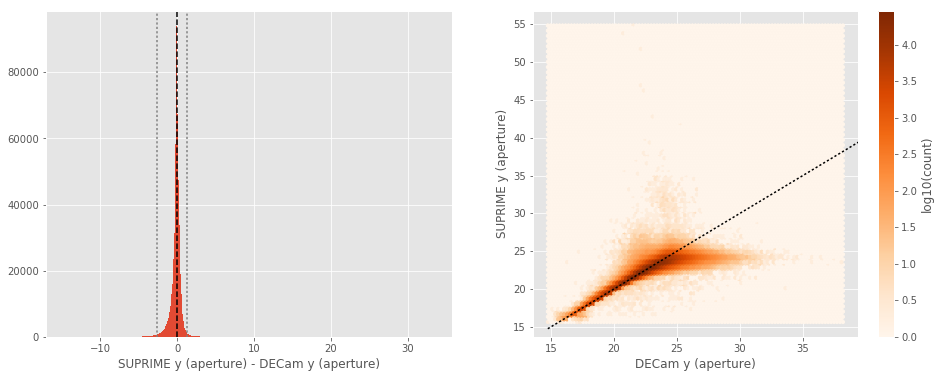

SUPRIME y (total) - DECam y (total):
- Median: -0.13
- Median Absolute Deviation: 0.16
- 1% percentile: -1.6796945190429686
- 99% percentile: 1.617881584167482


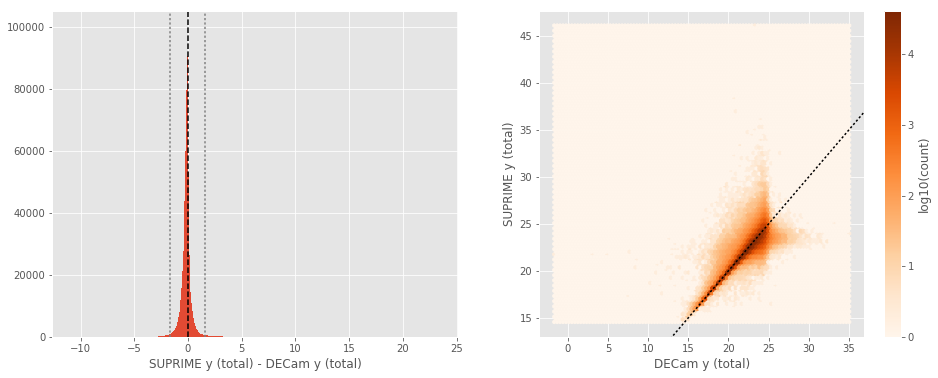

GPC1 y (aperture) - DECam y (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.16
- 1% percentile: -2.551000671386719
- 99% percentile: 2.121523895263673


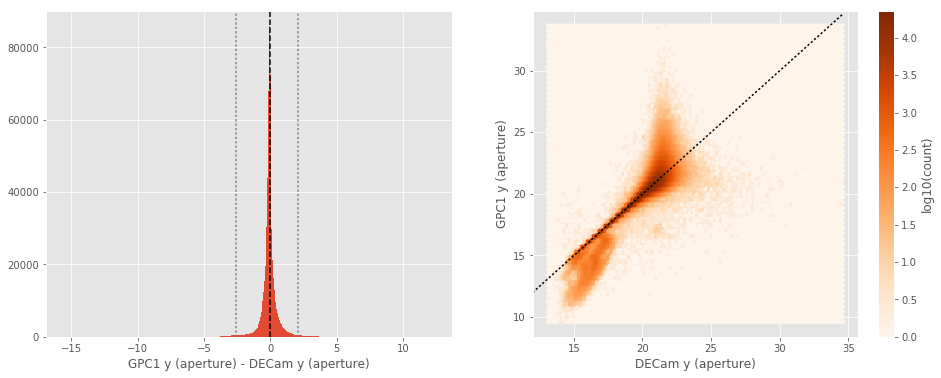

GPC1 y (total) - DECam y (total):
- Median: 0.14
- Median Absolute Deviation: 0.13
- 1% percentile: -0.8715282821655274
- 99% percentile: 1.098465843200684


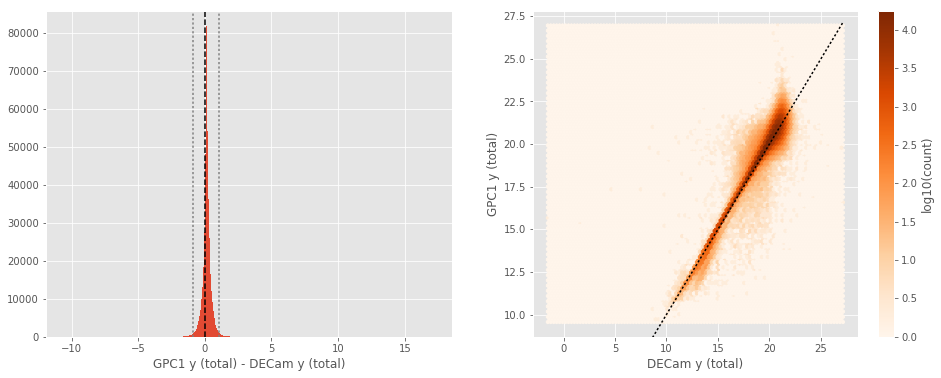

VISTA y (aperture) - DECam y (aperture):
- Median: -0.10
- Median Absolute Deviation: 0.16
- 1% percentile: -2.3000484275817867
- 99% percentile: 0.593829689025879


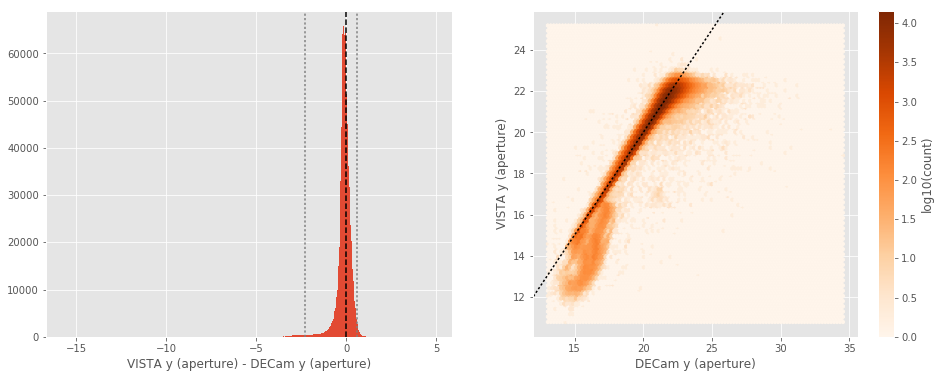

VISTA y (total) - DECam y (total):
- Median: -0.09
- Median Absolute Deviation: 0.17
- 1% percentile: -1.1985015869140625
- 99% percentile: 1.2269329071044917


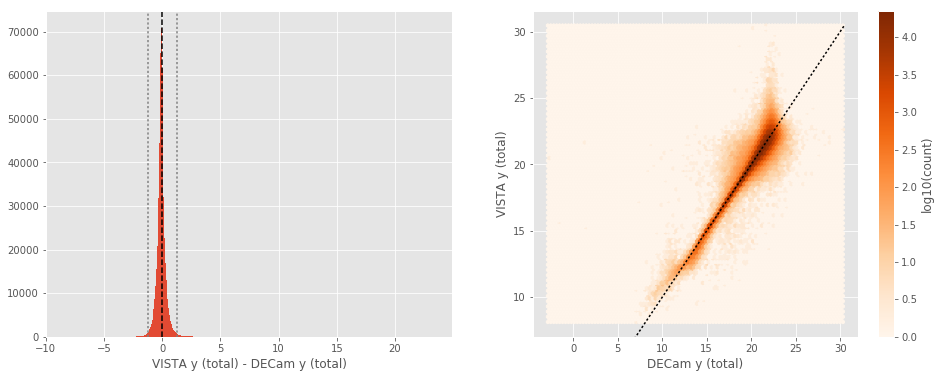

GPC1 y (aperture) - SUPRIME y (aperture):
- Median: -0.02
- Median Absolute Deviation: 0.22
- 1% percentile: -1.224795379638672
- 99% percentile: 2.1442562866210952


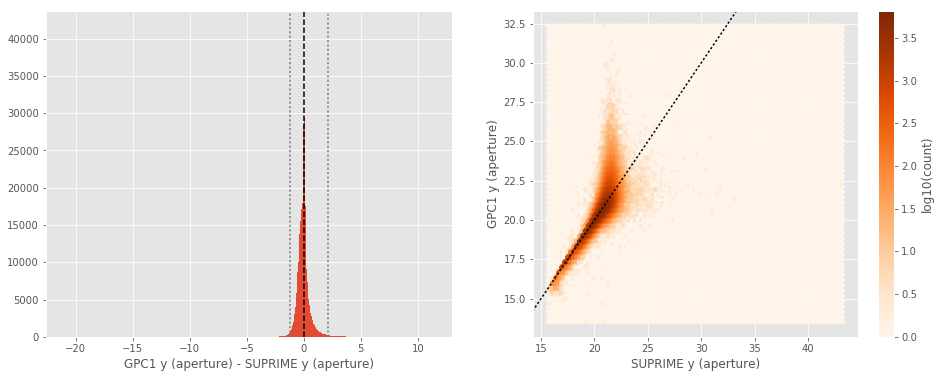

GPC1 y (total) - SUPRIME y (total):
- Median: 0.20
- Median Absolute Deviation: 0.14
- 1% percentile: -0.7608803749084473
- 99% percentile: 1.0445286750793448


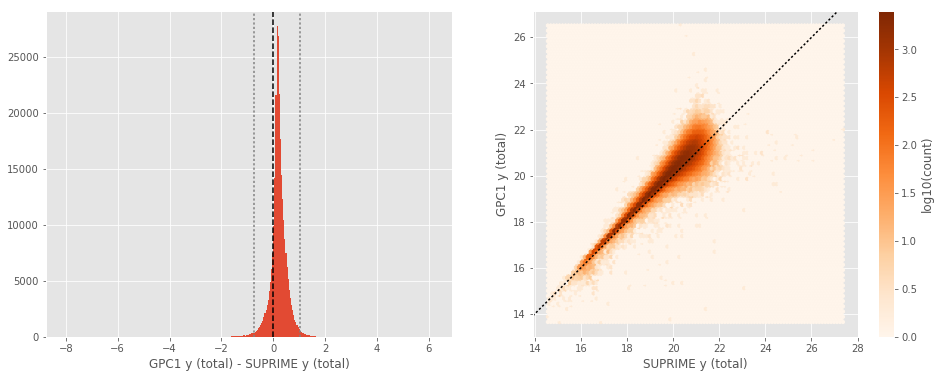

VISTA y (aperture) - SUPRIME y (aperture):
- Median: -0.07
- Median Absolute Deviation: 0.07
- 1% percentile: -1.813660430908203
- 99% percentile: 0.35906028747558416


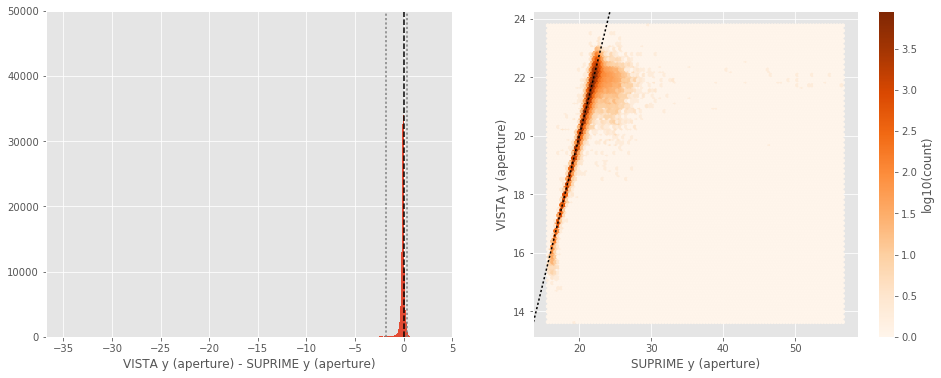

VISTA y (total) - SUPRIME y (total):
- Median: -0.02
- Median Absolute Deviation: 0.17
- 1% percentile: -1.8913174438476563
- 99% percentile: 1.1965563964843762


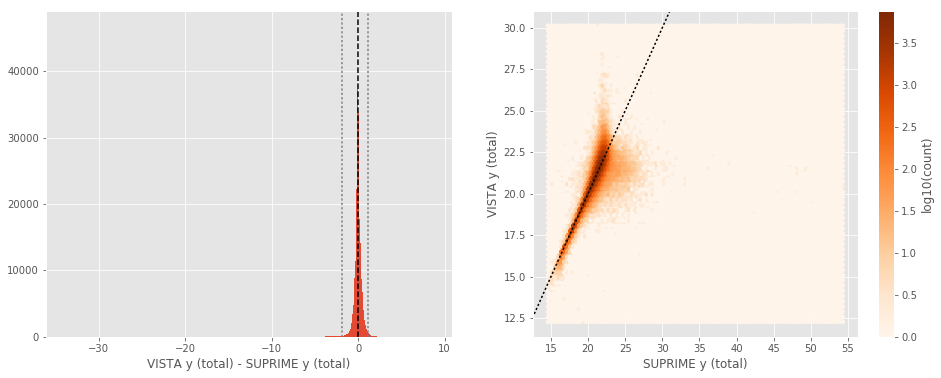

VISTA y (aperture) - GPC1 y (aperture):
- Median: -0.04
- Median Absolute Deviation: 0.19
- 1% percentile: -2.096534767150879
- 99% percentile: 1.0497679519653313


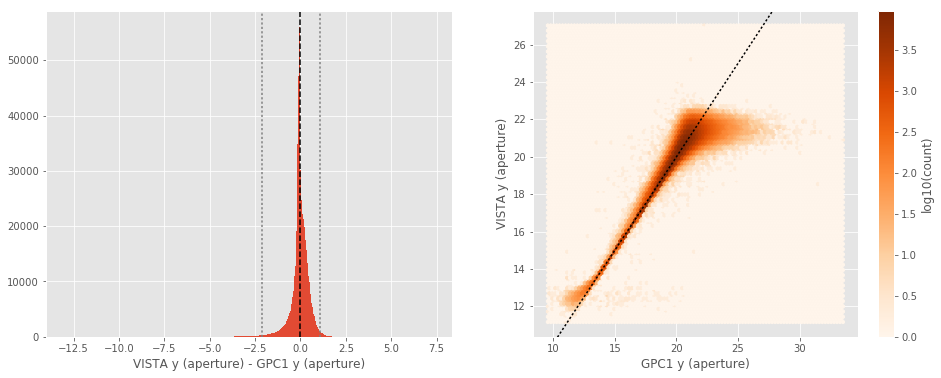

VISTA y (total) - GPC1 y (total):
- Median: -0.22
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1843351745605468
- 99% percentile: 0.9675631904602049


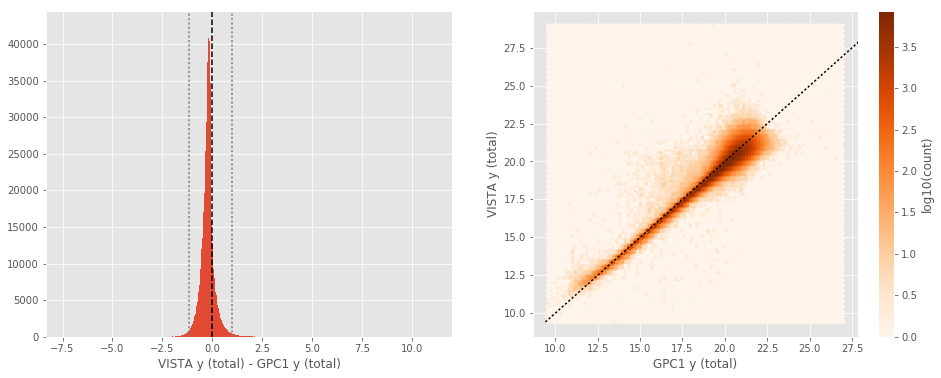

In [10]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):
        
        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        nb_compare_mags(master_catalogue[col1], master_catalogue[col2], 
                        labels=("{} (total)".format(band1), "{} (total)".format(band2)))

## III - Comparing magnitudes to reference bands

Cross-match the master list to SDSS and 2MASS to compare its magnitudes to SDSS and 2MASS ones.

In [11]:
master_catalogue_coords = SkyCoord(master_catalogue['ra'], master_catalogue['dec'])

### III.a - Comparing u, g, r, i, and z bands to SDSS

The catalogue is cross-matched to SDSS-DR13 withing 0.2 arcsecond. 

We compare the u, g, r, i, and z magnitudes to those from SDSS using `fiberMag` for the aperture magnitude and `petroMag`  for the total magnitude.

In [12]:
sdss = Table.read("../../dmu0/dmu0_SDSS-DR13/data/SDSS-DR13_GAMA-09.fits")
sdss_coords = SkyCoord(sdss['ra'] * u.deg, sdss['dec'] * u.deg)

idx, d2d, _ = sdss_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

sdss = sdss[mask]
ml_sdss_idx = idx[mask]

Megacam u (aperture) - SDSS u (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.54
- 1% percentile: -2.7285282135009767
- 99% percentile: 3.4120958328247073


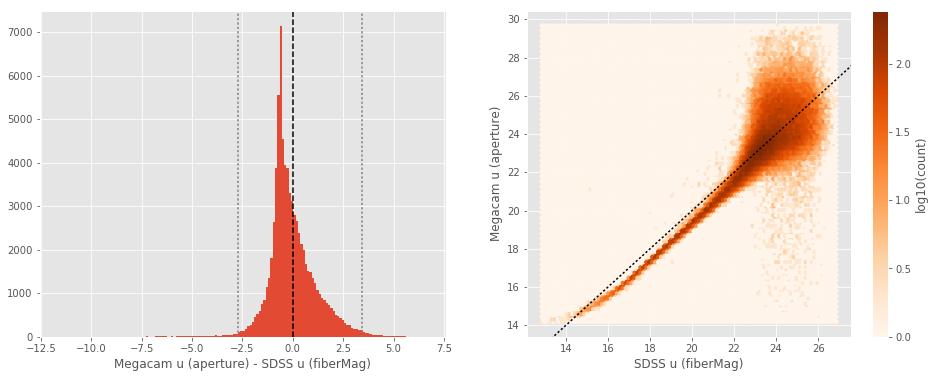

Megacam u (total) - SDSS u (petroMag):
- Median: -0.28
- Median Absolute Deviation: 0.54
- 1% percentile: -2.7285282135009767
- 99% percentile: 3.4120958328247073


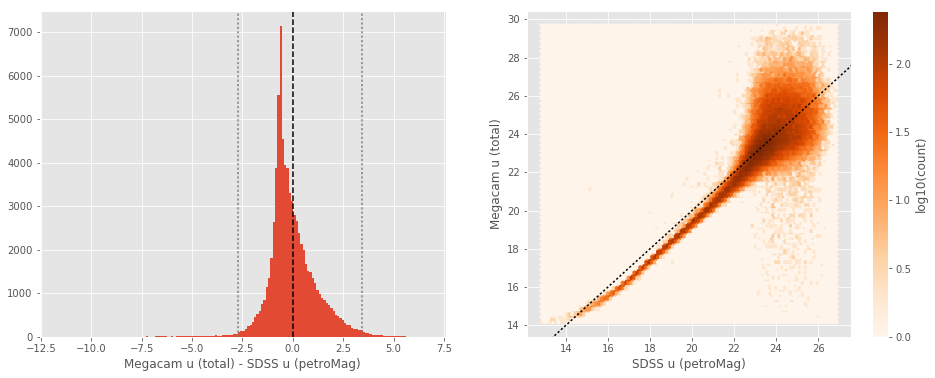

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:8: RuntimeWarning: invalid value encountered in less


OmegaCAM u (aperture) - SDSS u (fiberMag):
- Median: 0.01
- Median Absolute Deviation: 0.40
- 1% percentile: -1.731709632873535
- 99% percentile: 3.0590649795532174


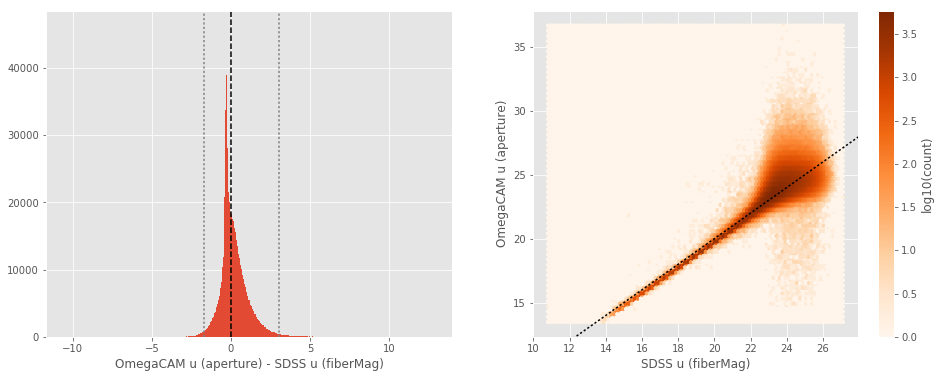

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less


OmegaCAM u (total) - SDSS u (petroMag):
- Median: 0.01
- Median Absolute Deviation: 0.40
- 1% percentile: -1.731709632873535
- 99% percentile: 3.0590649795532174


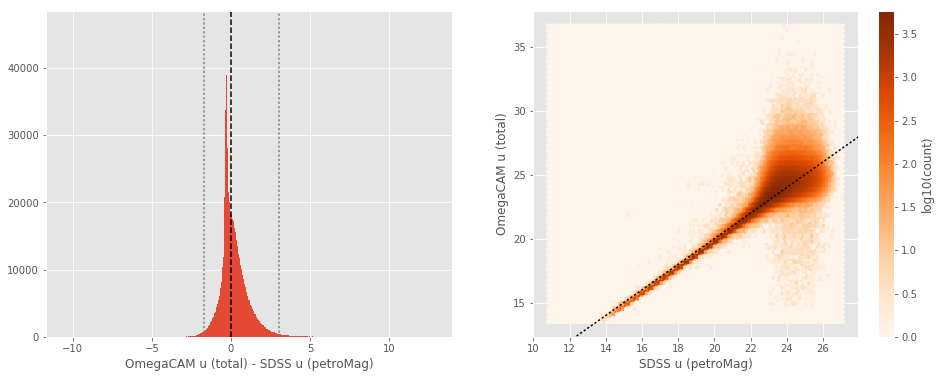

Megacam g (aperture) - SDSS g (fiberMag):
- Median: -0.37
- Median Absolute Deviation: 0.12
- 1% percentile: -1.1864328956604004
- 99% percentile: 0.9577699279785143


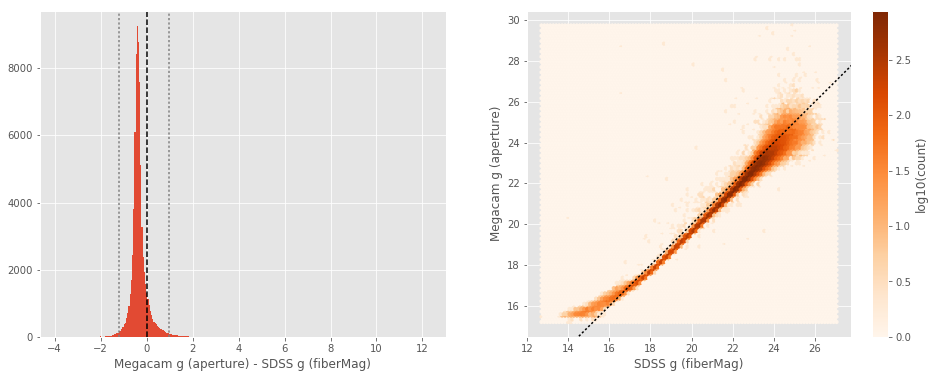

Megacam g (total) - SDSS g (petroMag):
- Median: -0.37
- Median Absolute Deviation: 0.12
- 1% percentile: -1.1864328956604004
- 99% percentile: 0.9577699279785143


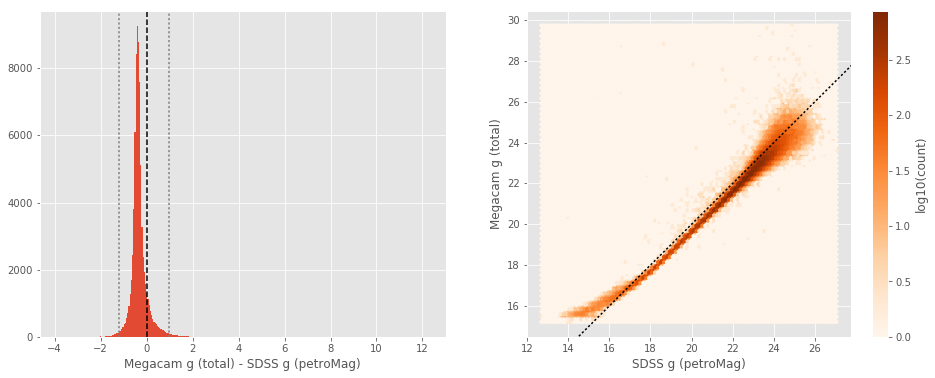

No sources have both SDSS g (fiberMag) and DECam g (aperture) values.
No sources have both SDSS g (petroMag) and DECam g (total) values.
OmegaCAM g (aperture) - SDSS g (fiberMag):
- Median: -0.23
- Median Absolute Deviation: 0.14
- 1% percentile: -1.0691062164306642
- 99% percentile: 0.9832138824462886


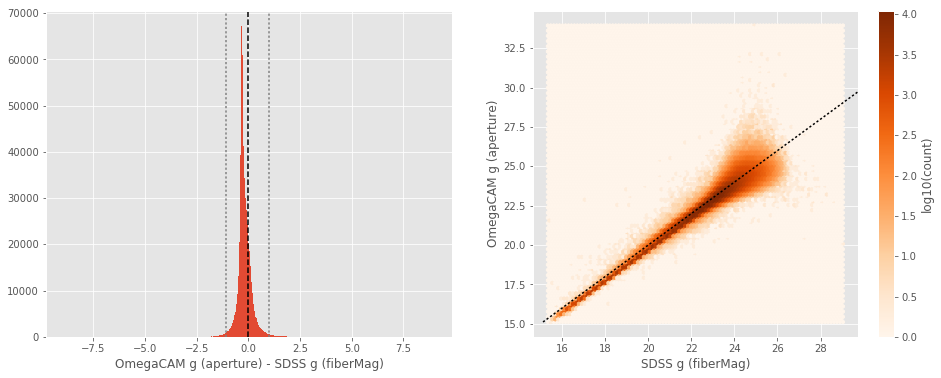

OmegaCAM g (total) - SDSS g (petroMag):
- Median: -0.23
- Median Absolute Deviation: 0.14
- 1% percentile: -1.0691062164306642
- 99% percentile: 0.9832138824462886


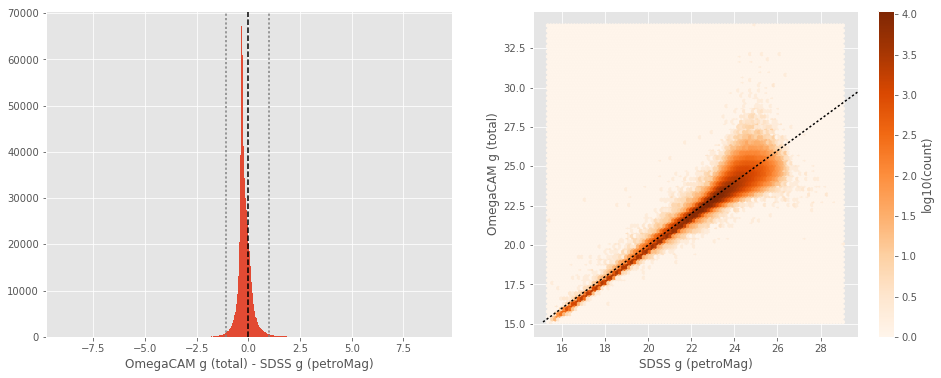

SUPRIME g (aperture) - SDSS g (fiberMag):
- Median: -0.33
- Median Absolute Deviation: 0.16
- 1% percentile: -1.1825799942016602
- 99% percentile: 0.9503312110900879


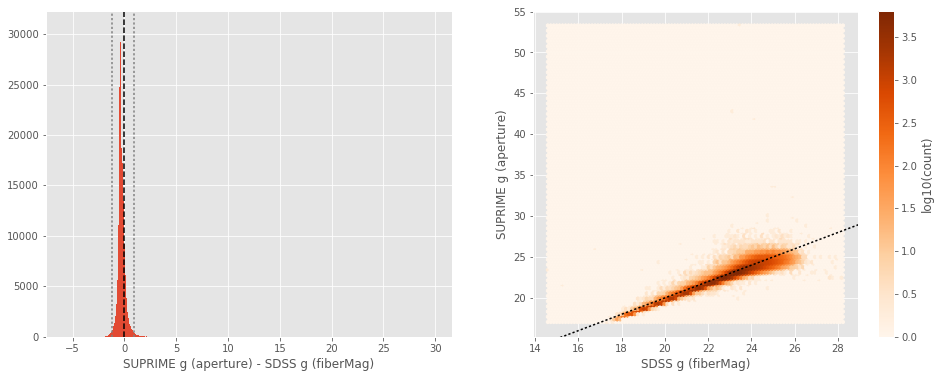

SUPRIME g (total) - SDSS g (petroMag):
- Median: -0.33
- Median Absolute Deviation: 0.16
- 1% percentile: -1.1825799942016602
- 99% percentile: 0.9503312110900879


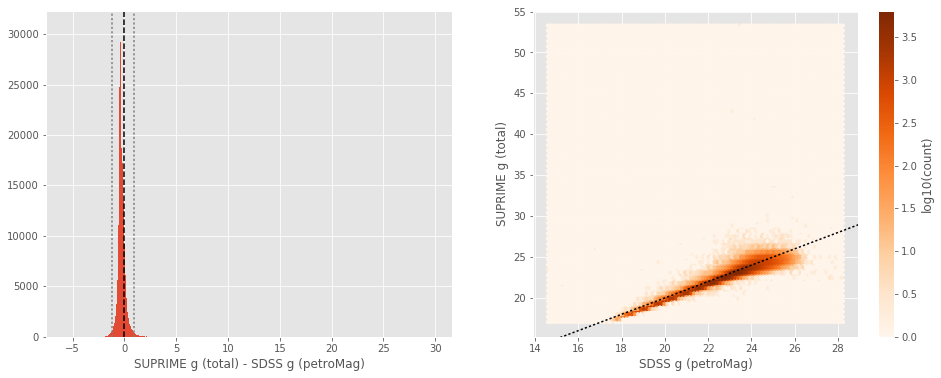

GPC1 g (aperture) - SDSS g (fiberMag):
- Median: -0.48
- Median Absolute Deviation: 0.21
- 1% percentile: -1.9536190032958984
- 99% percentile: 1.9463558197021484


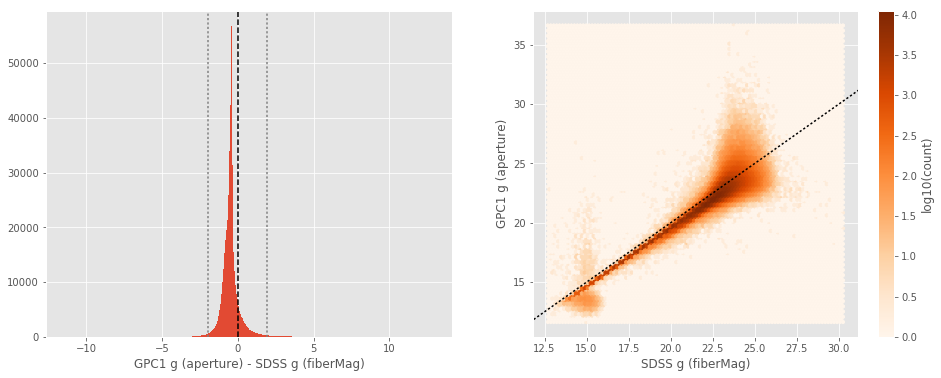

GPC1 g (total) - SDSS g (petroMag):
- Median: -0.48
- Median Absolute Deviation: 0.21
- 1% percentile: -1.9536190032958984
- 99% percentile: 1.9463558197021484


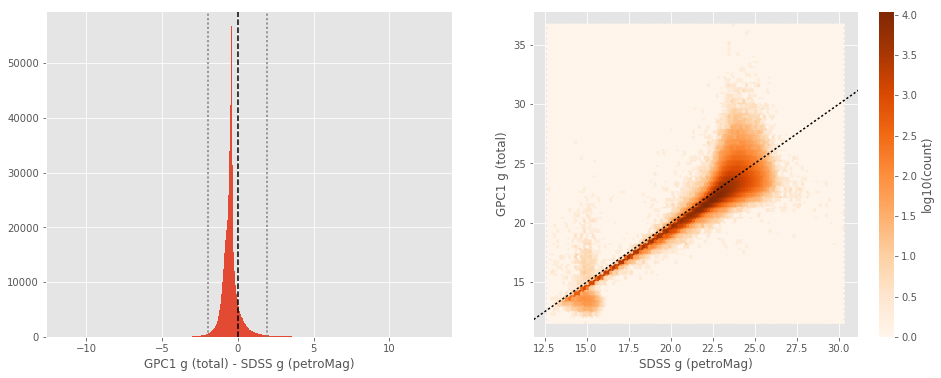

Megacam r (aperture) - SDSS r (fiberMag):
- Median: -0.29
- Median Absolute Deviation: 0.07
- 1% percentile: -0.9603889465332031
- 99% percentile: 0.674439620971681


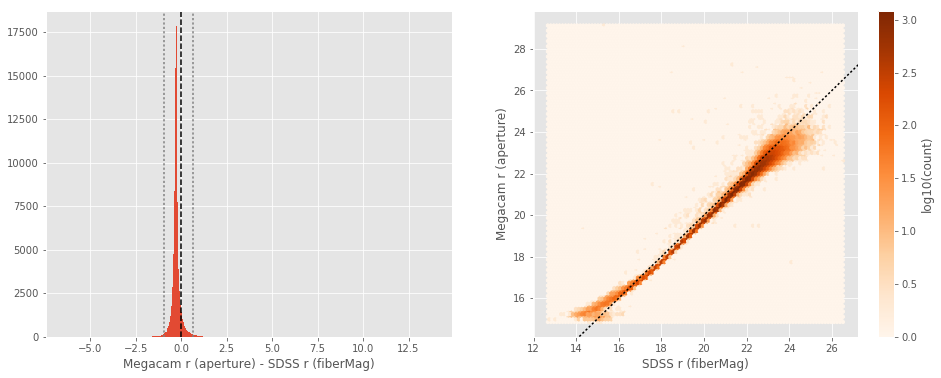

Megacam r (total) - SDSS r (petroMag):
- Median: -0.29
- Median Absolute Deviation: 0.07
- 1% percentile: -0.9603889465332031
- 99% percentile: 0.674439620971681


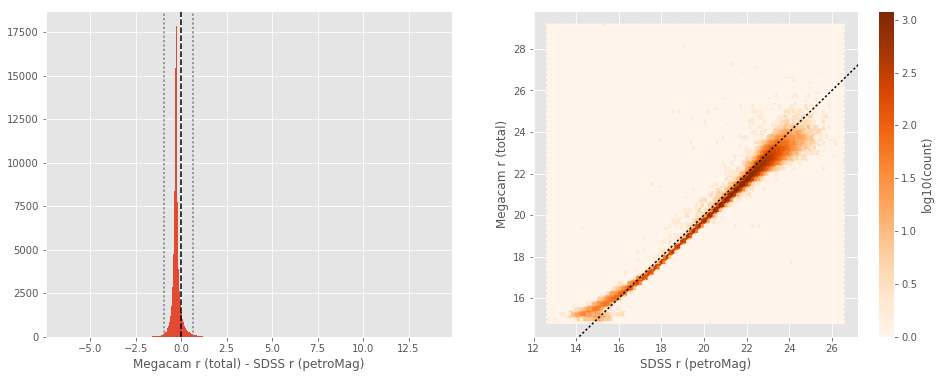

DECam r (aperture) - SDSS r (fiberMag):
- Median: 0.67
- Median Absolute Deviation: 0.36
- 1% percentile: -0.42902996063232424
- 99% percentile: 2.777619094848629


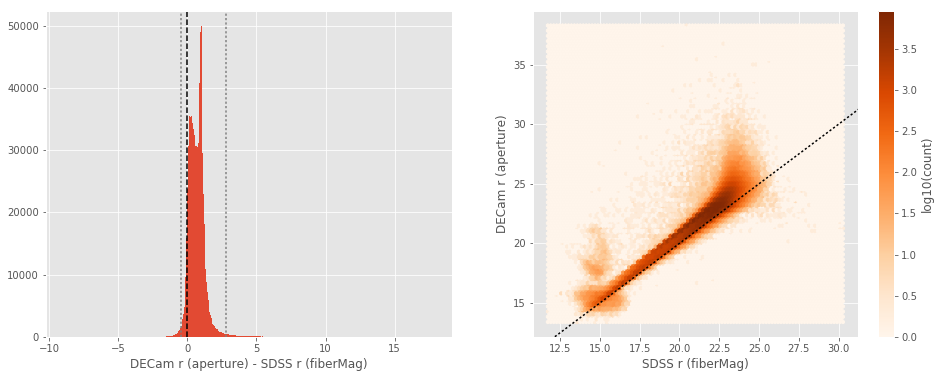

DECam r (total) - SDSS r (petroMag):
- Median: 0.67
- Median Absolute Deviation: 0.36
- 1% percentile: -0.42902996063232424
- 99% percentile: 2.777619094848629


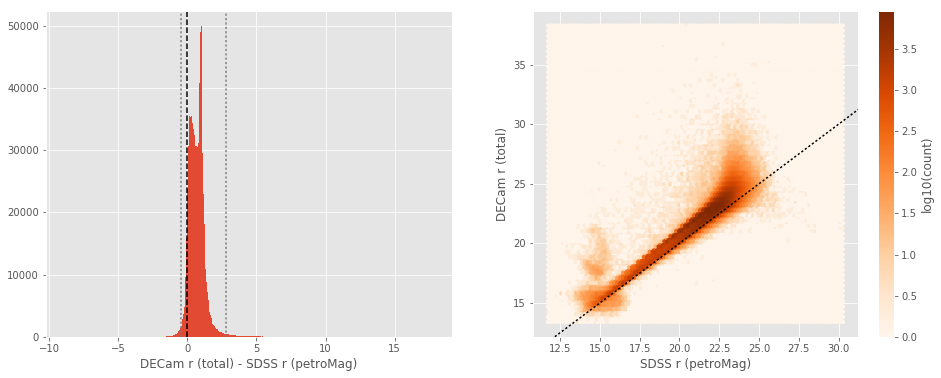

OmegaCAM r (aperture) - SDSS r (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.10
- 1% percentile: -0.9489803314208984
- 99% percentile: 0.3543125152587896


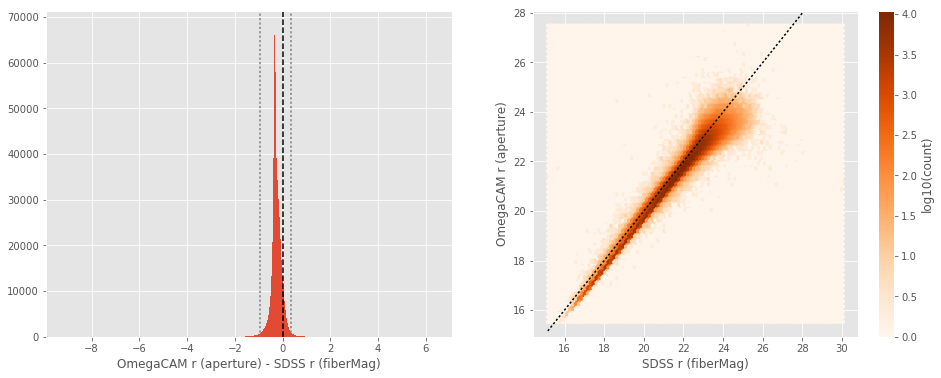

OmegaCAM r (total) - SDSS r (petroMag):
- Median: -0.28
- Median Absolute Deviation: 0.10
- 1% percentile: -0.9489803314208984
- 99% percentile: 0.3543125152587896


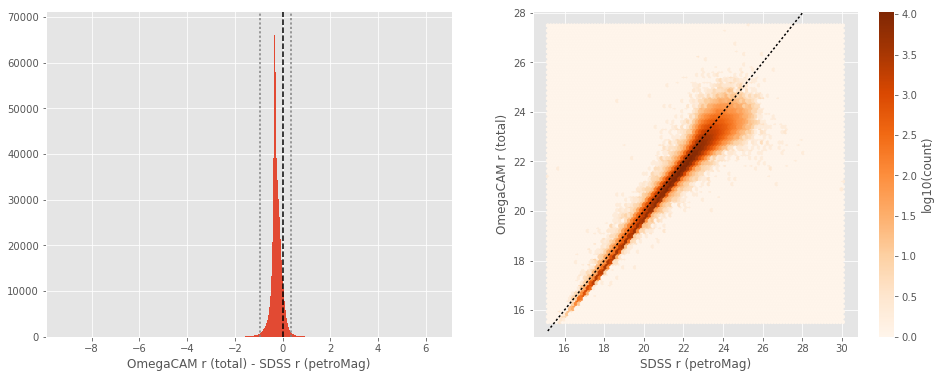

SUPRIME r (aperture) - SDSS r (fiberMag):
- Median: -0.29
- Median Absolute Deviation: 0.11
- 1% percentile: -0.9806583404541016
- 99% percentile: 0.5410251617431645


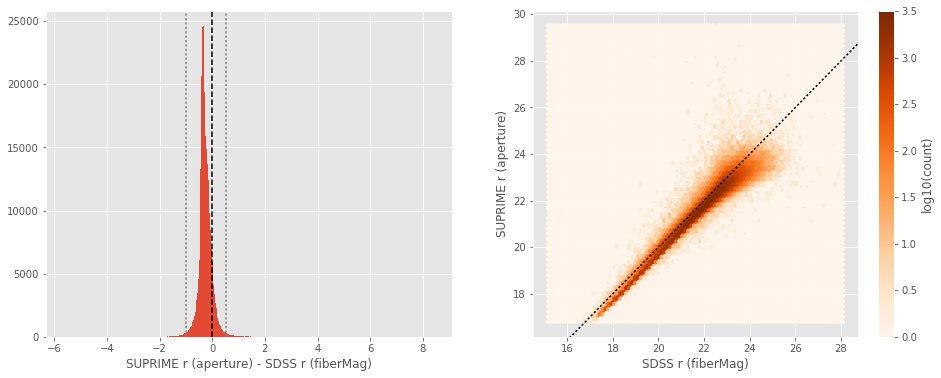

SUPRIME r (total) - SDSS r (petroMag):
- Median: -0.29
- Median Absolute Deviation: 0.11
- 1% percentile: -0.9806583404541016
- 99% percentile: 0.5410251617431645


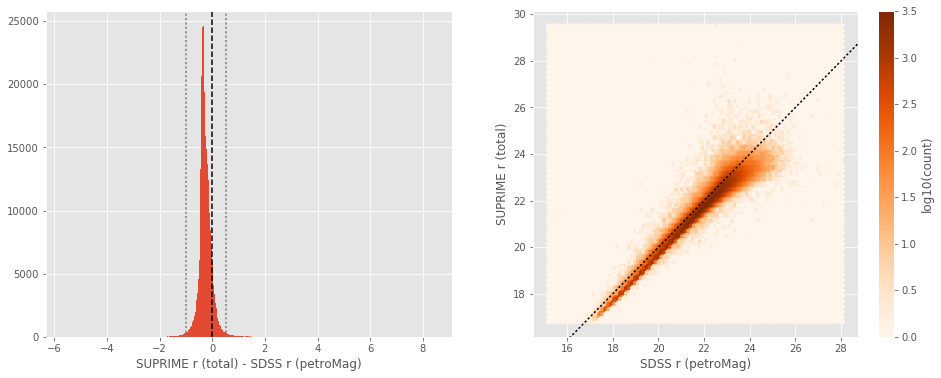

GPC1 r (aperture) - SDSS r (fiberMag):
- Median: -0.37
- Median Absolute Deviation: 0.15
- 1% percentile: -1.4739552879333497
- 99% percentile: 1.224787559509278


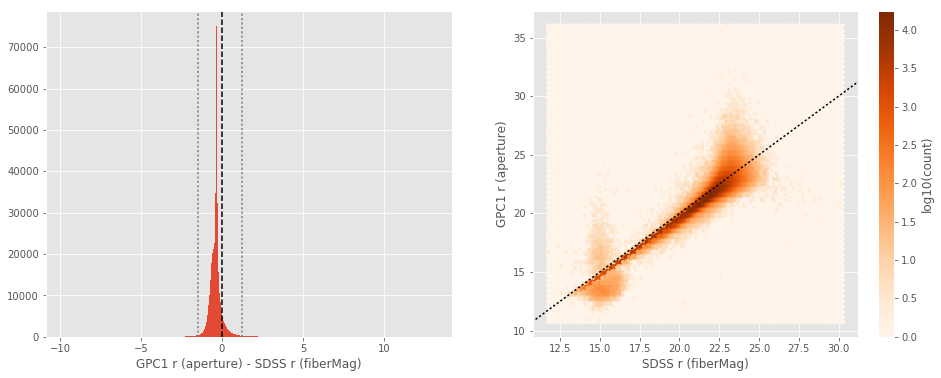

GPC1 r (total) - SDSS r (petroMag):
- Median: -0.37
- Median Absolute Deviation: 0.15
- 1% percentile: -1.4739552879333497
- 99% percentile: 1.224787559509278


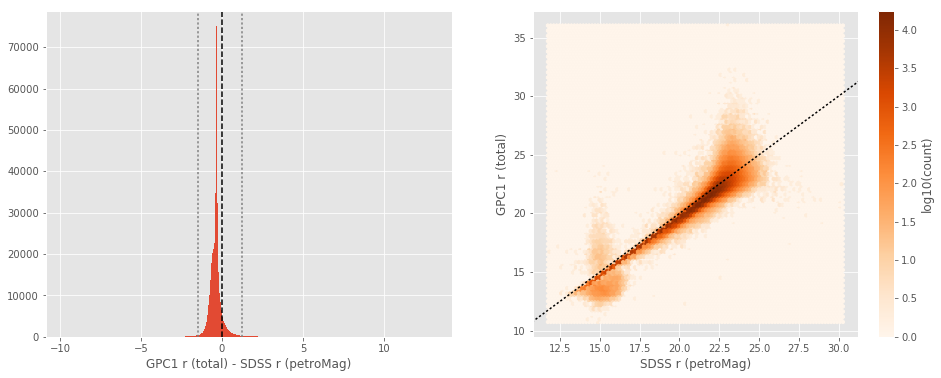

Megacam i (aperture) - SDSS i (fiberMag):
- Median: -0.33
- Median Absolute Deviation: 0.08
- 1% percentile: -0.8616498947143555
- 99% percentile: 0.7761422729492189


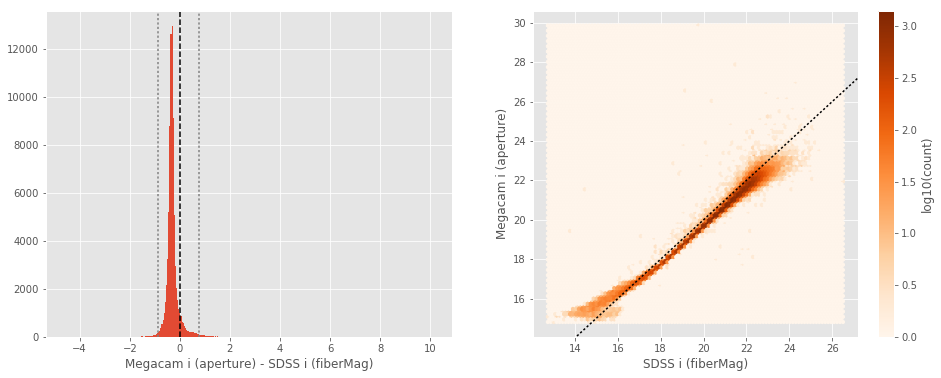

Megacam i (total) - SDSS i (petroMag):
- Median: -0.33
- Median Absolute Deviation: 0.08
- 1% percentile: -0.8616498947143555
- 99% percentile: 0.7761422729492189


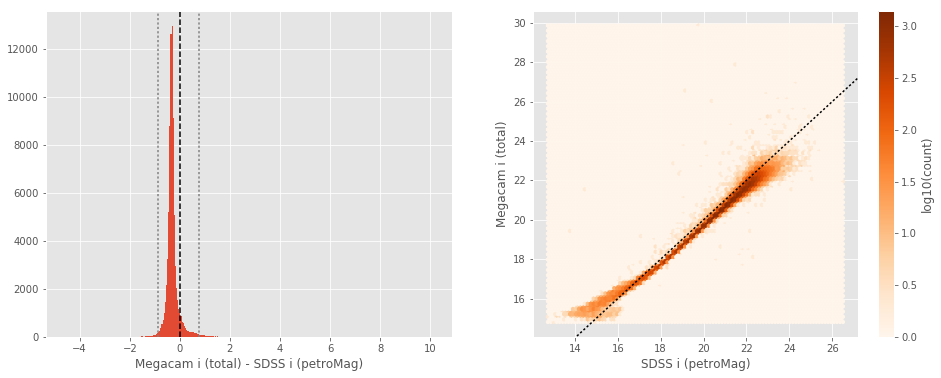

DECam i (aperture) - SDSS i (fiberMag):
- Median: 0.06
- Median Absolute Deviation: 0.26
- 1% percentile: -0.6955982208251953
- 99% percentile: 1.7818977355957015


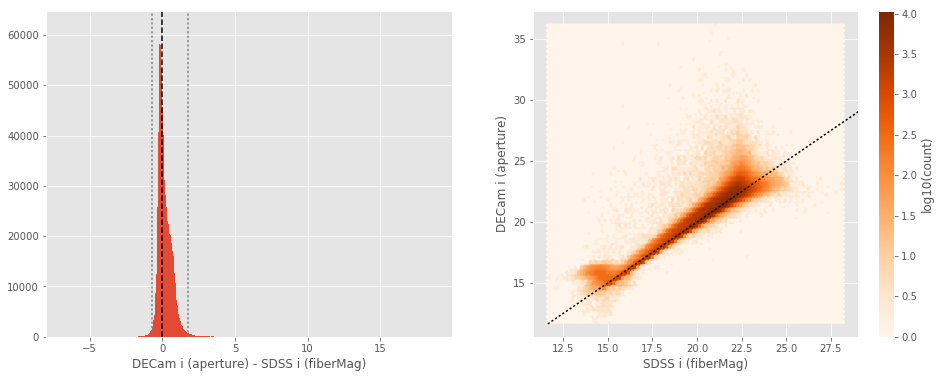

DECam i (total) - SDSS i (petroMag):
- Median: 0.06
- Median Absolute Deviation: 0.26
- 1% percentile: -0.6955982208251953
- 99% percentile: 1.7818977355957015


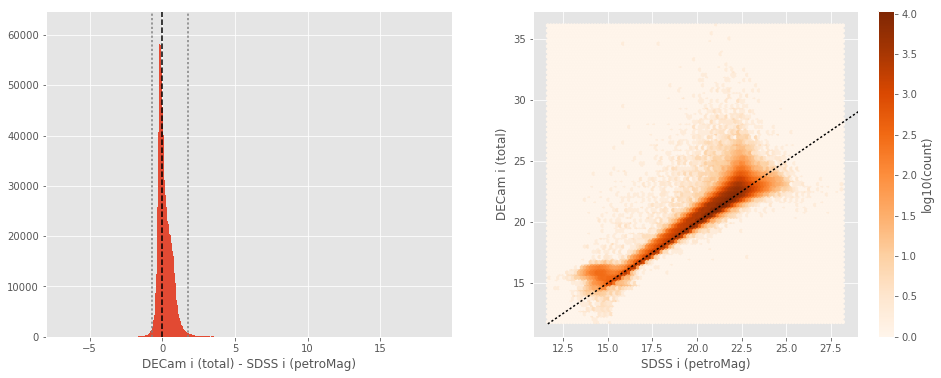

OmegaCAM i (aperture) - SDSS i (fiberMag):
- Median: -0.28
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8460443115234375
- 99% percentile: 0.3708203125


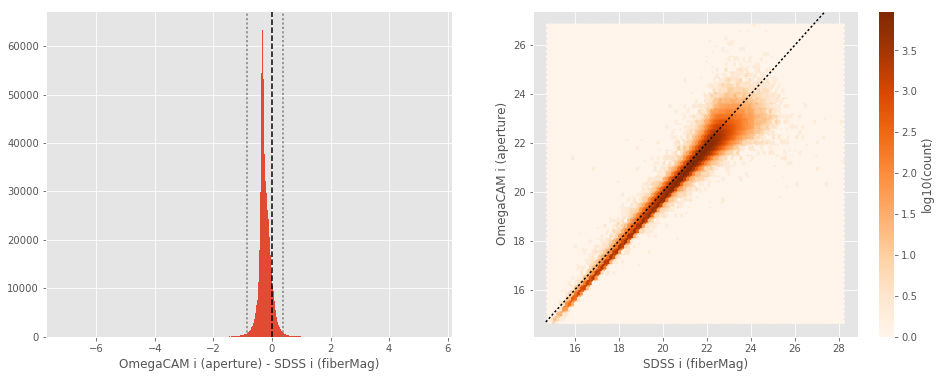

OmegaCAM i (total) - SDSS i (petroMag):
- Median: -0.28
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8460443115234375
- 99% percentile: 0.3708203125


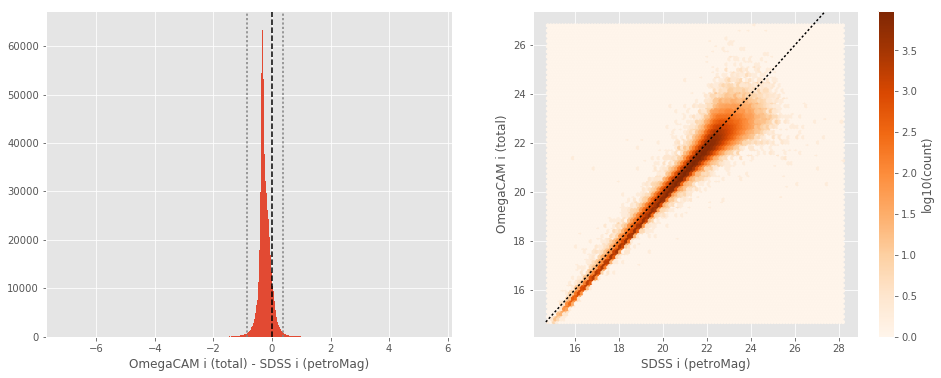

SUPRIME i (aperture) - SDSS i (fiberMag):
- Median: -0.33
- Median Absolute Deviation: 0.12
- 1% percentile: -0.9216645431518555
- 99% percentile: 0.4745624923706022


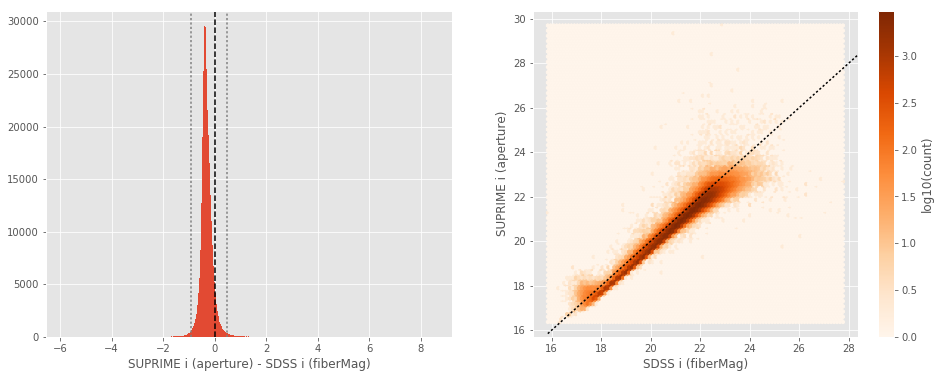

SUPRIME i (total) - SDSS i (petroMag):
- Median: -0.33
- Median Absolute Deviation: 0.12
- 1% percentile: -0.9216645431518555
- 99% percentile: 0.4745624923706022


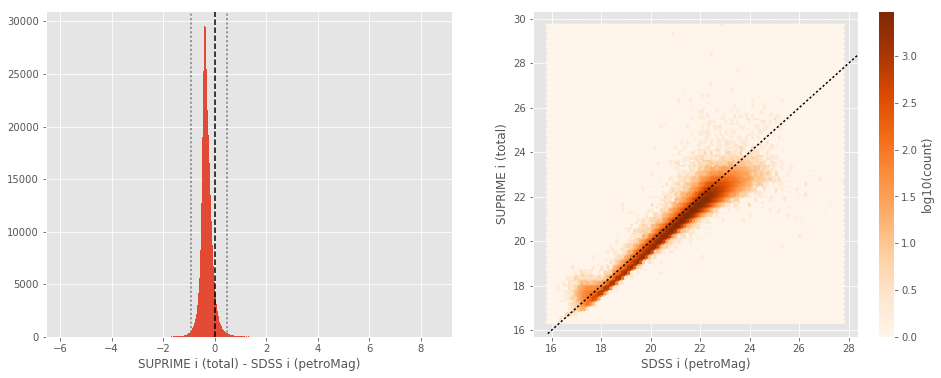

GPC1 i (aperture) - SDSS i (fiberMag):
- Median: -0.36
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1725231361389161
- 99% percentile: 0.5947527122497547


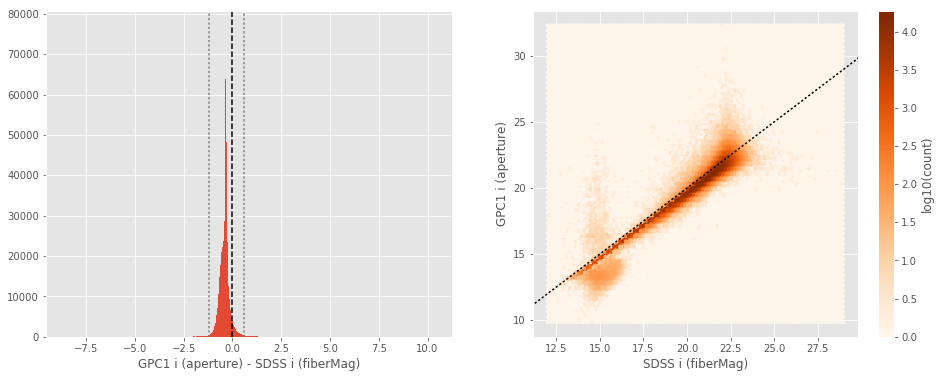

GPC1 i (total) - SDSS i (petroMag):
- Median: -0.36
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1725231361389161
- 99% percentile: 0.5947527122497547


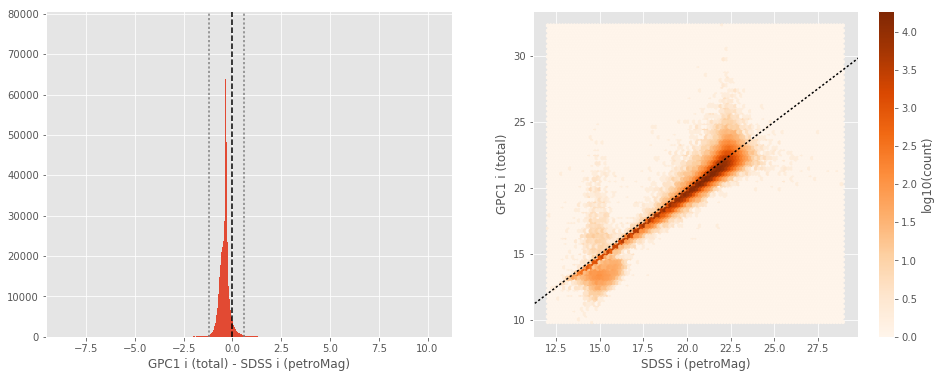

Megacam z (aperture) - SDSS z (fiberMag):
- Median: -0.16
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1580963134765625
- 99% percentile: 0.9310274124145501


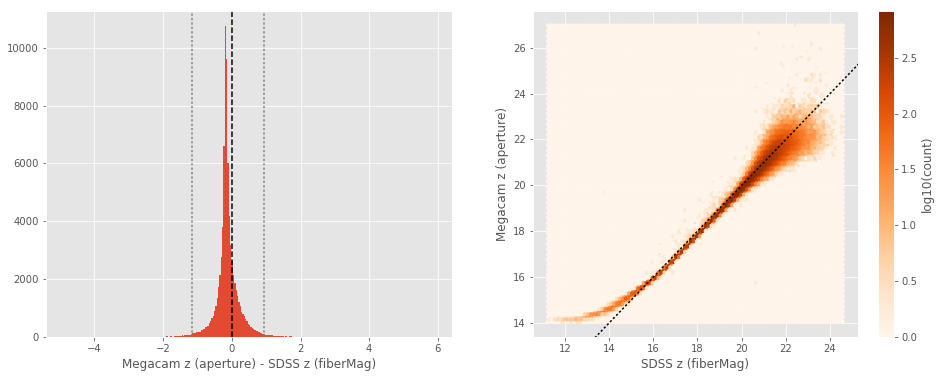

Megacam z (total) - SDSS z (petroMag):
- Median: -0.16
- Median Absolute Deviation: 0.11
- 1% percentile: -1.1580963134765625
- 99% percentile: 0.9310274124145501


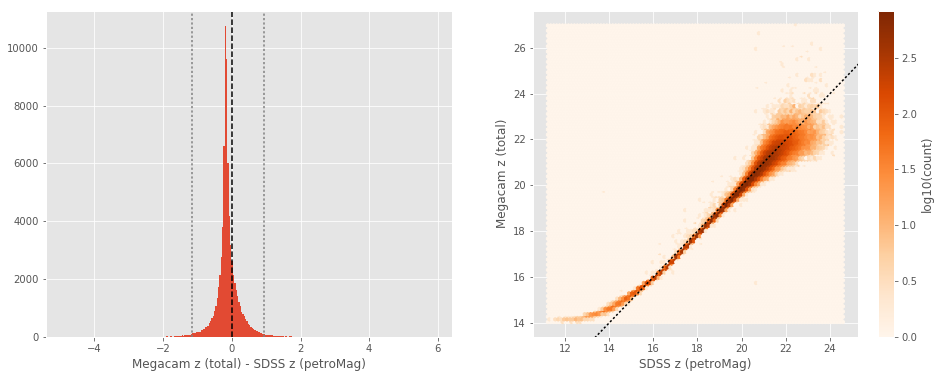

No sources have both SDSS z (fiberMag) and DECam z (aperture) values.
No sources have both SDSS z (petroMag) and DECam z (total) values.
SUPRIME z (aperture) - SDSS z (fiberMag):
- Median: -0.24
- Median Absolute Deviation: 0.17
- 1% percentile: -1.3240626907348634
- 99% percentile: 0.8835285186767574


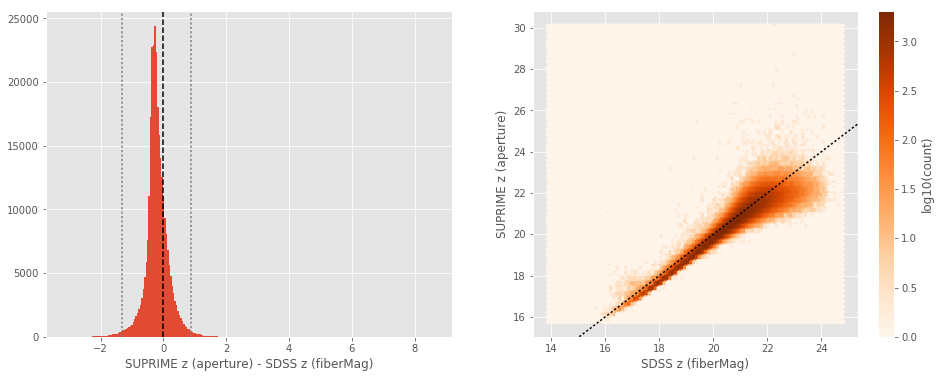

SUPRIME z (total) - SDSS z (petroMag):
- Median: -0.24
- Median Absolute Deviation: 0.17
- 1% percentile: -1.3240626907348634
- 99% percentile: 0.8835285186767574


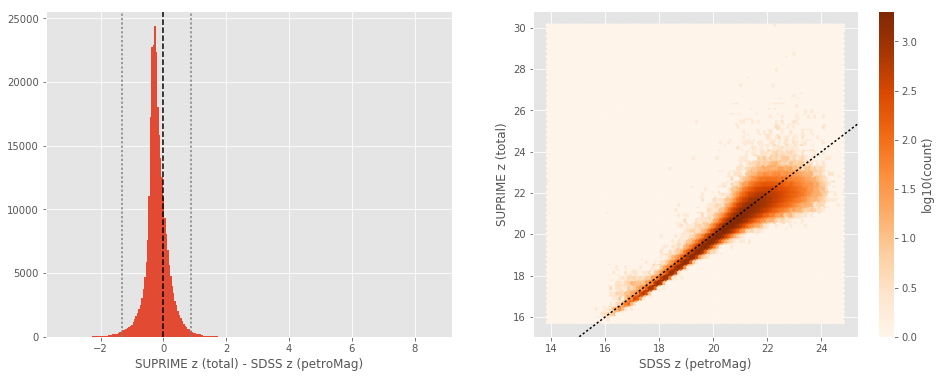

GPC1 z (aperture) - SDSS z (fiberMag):
- Median: -0.29
- Median Absolute Deviation: 0.13
- 1% percentile: -1.2603874206542969
- 99% percentile: 1.0066204071044922


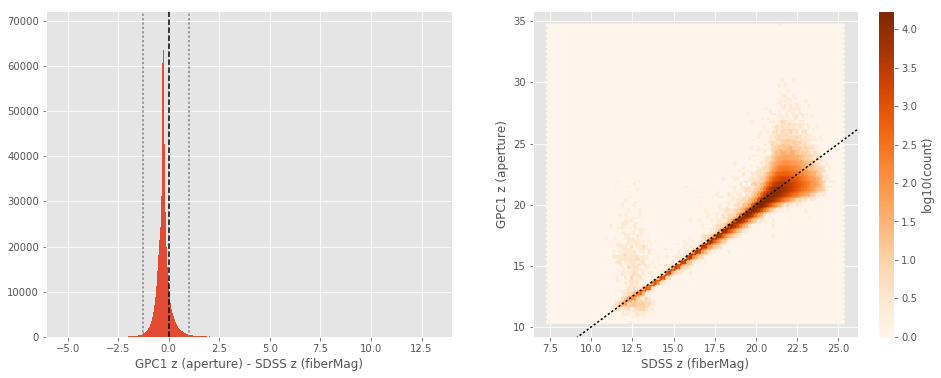

GPC1 z (total) - SDSS z (petroMag):
- Median: -0.29
- Median Absolute Deviation: 0.13
- 1% percentile: -1.2603874206542969
- 99% percentile: 1.0066204071044922


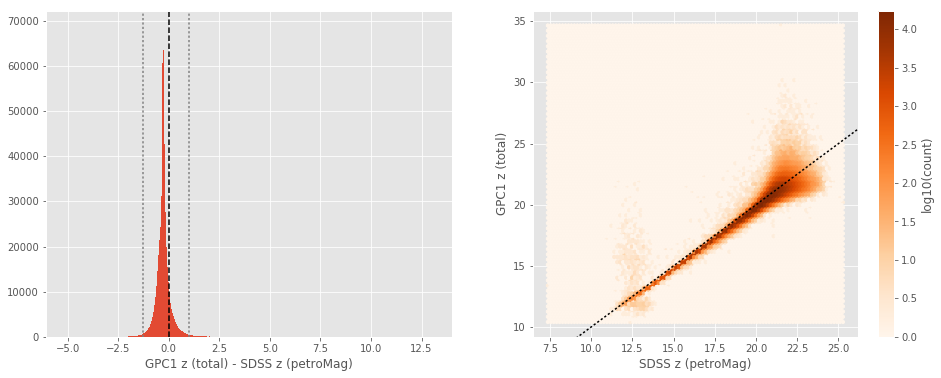

In [13]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands]:
    for band in band_of_a_kind:
        
        sdss_mag_ap = sdss["fiberMag_{}".format(band[-1])]
        master_cat_mag_ap = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        # SDSS use negative magnitudes to indicate missing data
        sdss_mag_ap[sdss_mag_ap < 0] = np.nan
    
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (fiberMag)".format(band[-1]), "{} (aperture)".format(band)))
    
        sdss_mag_tot = sdss["petroMag_{}".format(band[-1])]
        master_cat_mag_tot = master_catalogue["m_ap_{}".format(band.replace(" ", "_").lower())][ml_sdss_idx]
        
        # SDSS use negative magnitudes to indicate missing data
        sdss_mag_tot[sdss_mag_tot < 0] = np.nan
        
        nb_compare_mags(sdss_mag_ap, master_cat_mag_ap,
                        labels=("SDSS {} (petroMag)".format(band[-1]), "{} (total)".format(band)))

### III.b - Comparing J and K bands to 2MASS

The catalogue is cross-matched to 2MASS-PSC withing 0.2 arcsecond. We compare the UKIDSS total J and K magnitudes to those from 2MASS.

The 2MASS magnitudes are “*Vega-like*” and we have to convert them to AB magnitudes using the zero points provided on [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4a.html):

| Band | Fν - 0 mag (Jy) |
|------|-----------------|
| J    | 1594            |
| H    | 1024            |
| Ks   | 666.7           |

In addition, UKIDSS uses a K band whereas 2MASS uses a Ks (“short”) band, [this page](http://www.ipac.caltech.edu/2mass/releases/allsky/doc/sec6_4b.html) give a correction to convert the K band in a Ks band with the formula:

$$K_{s(2MASS)} = K_{UKIRT} + 0.003 + 0.004 * (J−K)_{UKIRT}$$

In [14]:
# The AB zero point is 3631 Jy
j_2mass_to_ab = 2.5 * np.log10(3631/1595)
k_2mass_to_ab = 2.5 * np.log10(3631/666.7)

In [15]:
twomass = Table.read("../../dmu0/dmu0_2MASS-point-sources/data/2MASS-PSC_GAMA-09.fits")
twomass_coords = SkyCoord(twomass['raj2000'], twomass['dej2000'])

idx, d2d, _ = twomass_coords.match_to_catalog_sky(master_catalogue_coords)
mask = (d2d < 0.2 * u.arcsec)

twomass = twomass[mask]
ml_twomass_idx = idx[mask]

UKIDSS J (total) - 2MASS J:
- Median: 0.07
- Median Absolute Deviation: 0.05
- 1% percentile: -0.5310508857633423
- 99% percentile: 1.8032715213869859


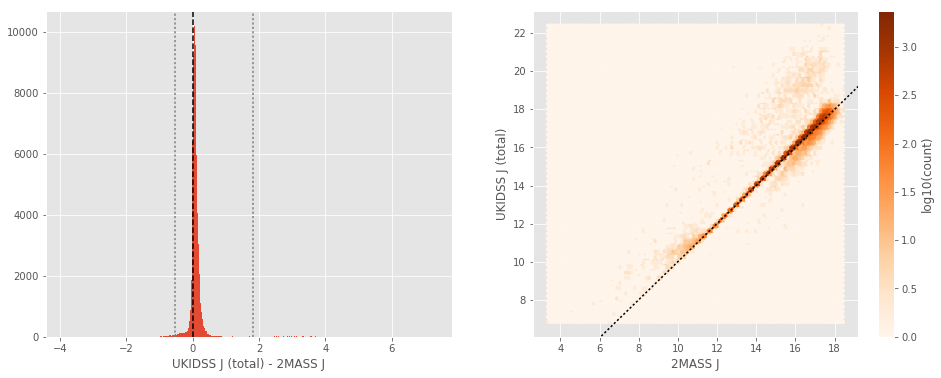

In [16]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_ukidss_j'][ml_twomass_idx],
                labels=("2MASS J", "UKIDSS J (total)"))

UKIDSS Ks-like (total) - 2MASS Ks:
- Median: 0.13
- Median Absolute Deviation: 0.08
- 1% percentile: -0.6729383827837481
- 99% percentile: 1.0823023398724985


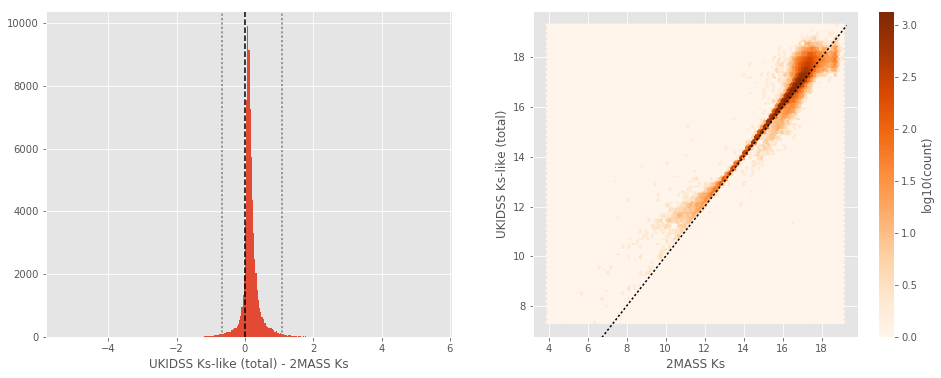

In [17]:
ukidss_ks_like = master_catalogue['m_ukidss_k'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "UKIDSS Ks-like (total)"))

VISTA J (total) - 2MASS J:
- Median: 0.05
- Median Absolute Deviation: 0.06
- 1% percentile: -0.7982499456693481
- 99% percentile: 1.2399132441804943


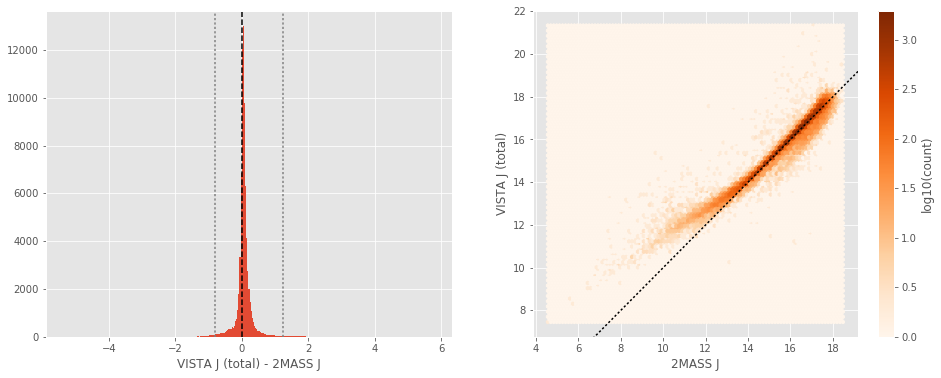

In [18]:
nb_compare_mags(twomass['jmag'] + j_2mass_to_ab, master_catalogue['m_vista_j'][ml_twomass_idx],
                labels=("2MASS J", "VISTA J (total)"))

VISTA Ks (total) - 2MASS Ks:
- Median: 0.06
- Median Absolute Deviation: 0.10
- 1% percentile: -0.8557365241272045
- 99% percentile: 1.2352498861160344


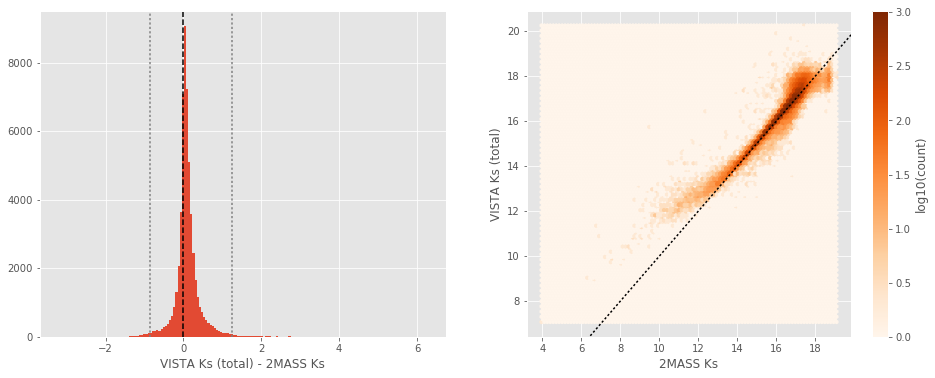

In [19]:
ukidss_ks_like = master_catalogue['m_vista_ks'] + 0.003 + 0.004 * (
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'])
nb_compare_mags(twomass['kmag'] + k_2mass_to_ab, ukidss_ks_like[ml_twomass_idx],
                labels=("2MASS Ks", "VISTA Ks (total)"))

## IV - Comparing aperture magnitudes to total ones.

Number of source used: 982483 / 12937749 (7.59%)


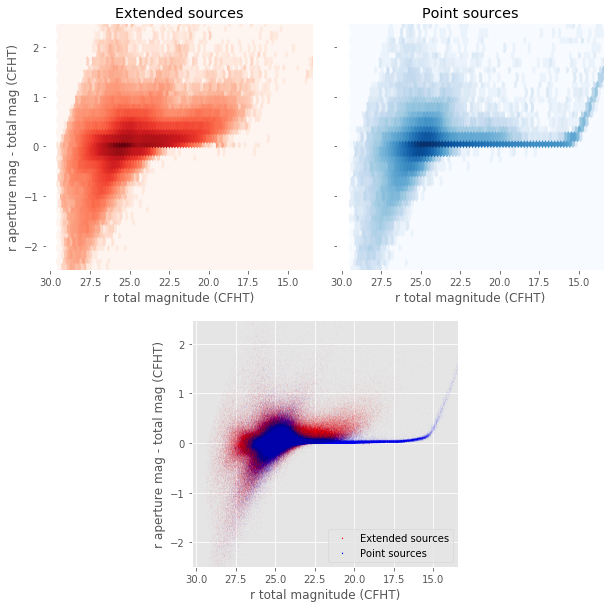

In [20]:
nb_ccplots(
    master_catalogue['m_megacam_r'],
    master_catalogue['m_ap_megacam_r'] - master_catalogue['m_megacam_r'],
    "r total magnitude (CFHT)", "r aperture mag - total mag (CFHT)",
    master_catalogue["stellarity"],
    invert_x=True
)

## V - Color-color and magnitude-color plots

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 166629 / 12937749 (1.29%)


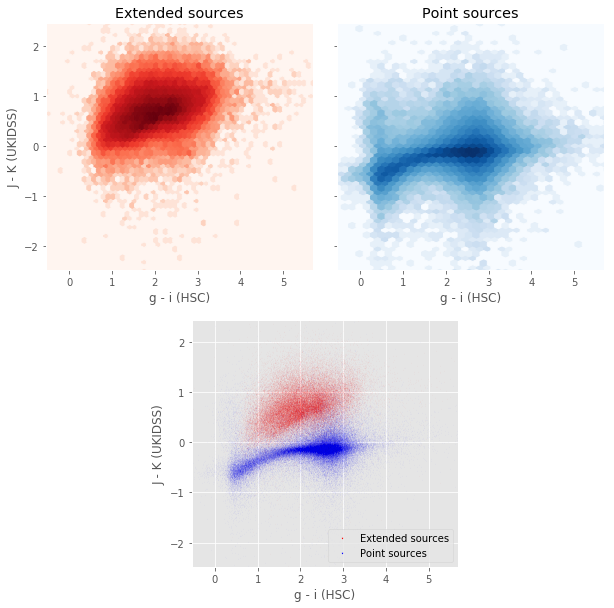

In [21]:
nb_ccplots(
    master_catalogue['m_suprime_g'] - master_catalogue['m_suprime_i'],
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    "g - i (HSC)", "J - K (UKIDSS)",
    master_catalogue["stellarity"]
)

Number of source used: 290884 / 12937749 (2.25%)


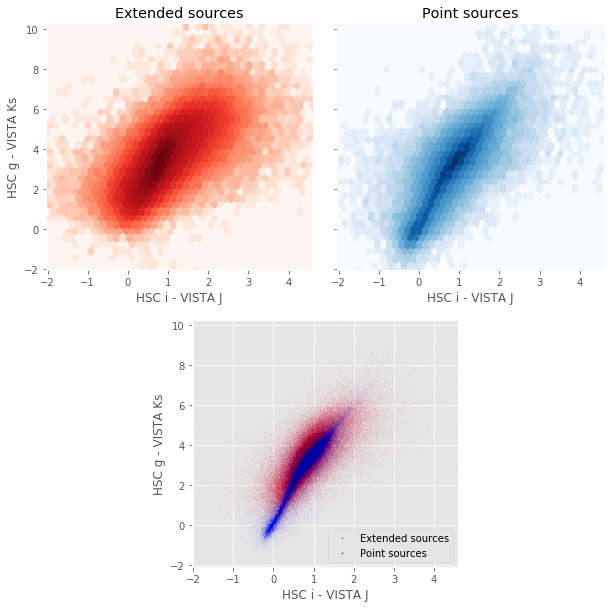

In [22]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_vista_j'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_vista_ks'],
    "HSC i - VISTA J", "HSC g - VISTA Ks",
    master_catalogue["stellarity"]
)

Number of source used: 856566 / 12937749 (6.62%)


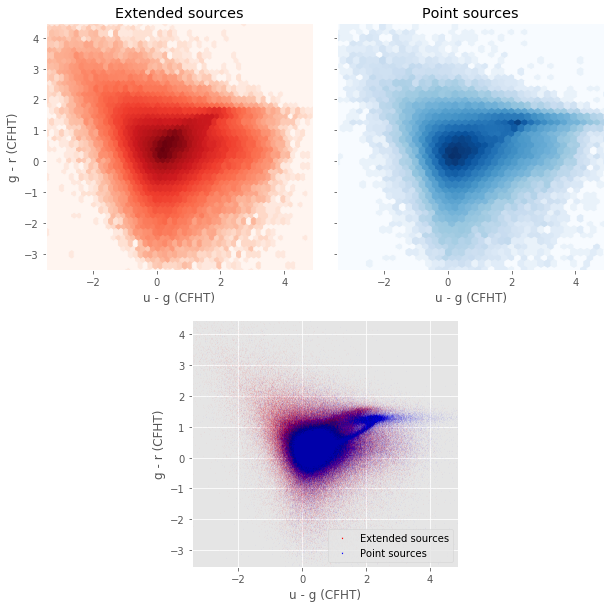

In [23]:
nb_ccplots(
    master_catalogue['m_megacam_u'] - master_catalogue['m_megacam_g'],
    master_catalogue['m_megacam_g'] - master_catalogue['m_megacam_r'],
    "u - g (CFHT)", "g - r (CFHT)",
    master_catalogue["stellarity"]
)

Number of source used: 166646 / 12937749 (1.29%)


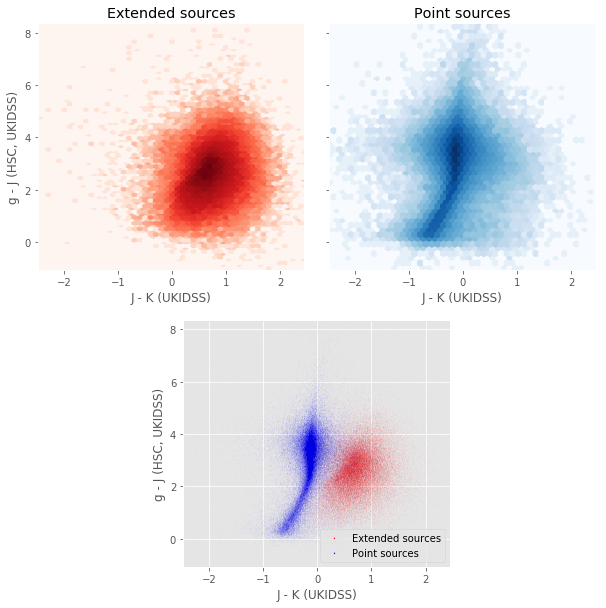

In [24]:
nb_ccplots(
    master_catalogue['m_ukidss_j'] - master_catalogue['m_ukidss_k'],
    master_catalogue['m_suprime_g'] - master_catalogue['m_ukidss_j'],
    "J - K (UKIDSS)", "g - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)

/opt/anaconda3/envs/herschelhelp_internal/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in subtract
  from ipykernel import kernelapp as app


Number of source used: 196743 / 12937749 (1.52%)


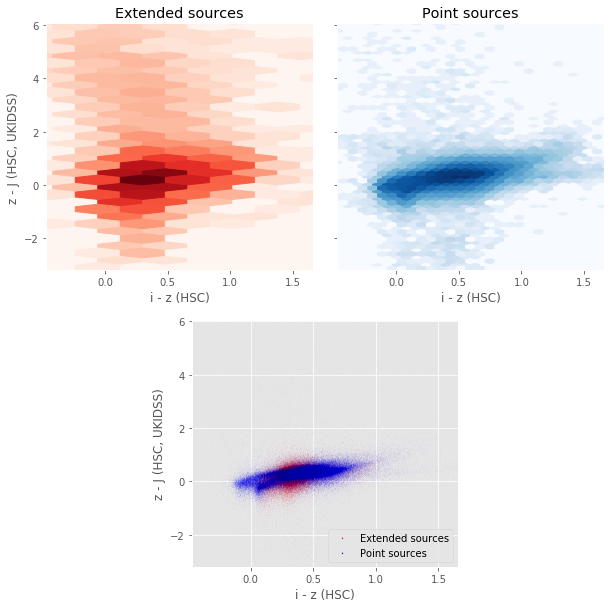

In [25]:
nb_ccplots(
    master_catalogue['m_suprime_i'] - master_catalogue['m_suprime_z'],
    master_catalogue['m_suprime_z'] - master_catalogue['m_ukidss_j'],
    "i - z (HSC)", "z - J (HSC, UKIDSS)",
    master_catalogue["stellarity"]
)